In [2]:
# !pip install statsmodels
# !pip install numpy
# !pip install patsy
# !pip install scipy
# !pip install openpyxl
# !pip install pycaret

In [3]:
!pip install --upgrade plotly

In [4]:
import pandas as pd
from pandas import Period
import numpy as np
from fbprophet import Prophet
from collections import namedtuple
from datetime import date,  datetime, timedelta
import datetime as dt
from multiprocessing import Pool, cpu_count
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
from re import search

import warnings
warnings.filterwarnings('ignore')

from statsmodels.tools.eval_measures import rmse, aic
from statsmodels.tsa.stattools import adfuller, acf
from statsmodels.tsa.api import VAR, VARMAX
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.stats.stattools import durbin_watson

from pycaret.regression import *


In [5]:
# print(pd.__version__)

In [6]:

class Quarter(namedtuple('Quarter', 'year quarter')):
    __slots__ = ()

    @classmethod
    def from_string(cls, text):
        """Convert 'NQM' into Quarter(year=2000+N, quarter=M)."""
        year, quarter = map(int, text.split('Q'))
        return cls(year + 2000, quarter)

    @classmethod
    def from_date(cls, date):
        """Create Quarter from datetime.date instance."""
        return cls(date.year, (date.month - 1) // 3 + 1)
    
    @classmethod
    def from_date1(cls, date):
        """Create Quarter Month from datetime.date instance."""
        return dt.date(date.year, 3 * ((date.month - 1) // 3) + 1, 1)
    

    def increment(self):
        """Return the next quarter."""
        if self.quarter < 4:
            return self.__class__(self.year, self.quarter + 1)
        else:
            assert self.quarter == 4
            return self.__class__(self.year + 1, 1)

    def __str__(self):
        """Convert to "NQM" text representation."""
        return "{year}Q{quarter}".format(year=self.year-2000, quarter=self.quarter)

In [7]:
# dt.date(2017, 4, 1)

# n = 12
# # n//3
# 3 * ((n-1)//3) +1

In [8]:
def generate_quarters(start, end):
    while start < end: #NOTE: not including *end*
        yield start
        start = start.increment()

start = Quarter.from_string('14Q3')
end = Quarter.from_date(date.today())
print("\n".join(map(str, generate_quarters(start, end))))


14Q3
14Q4
15Q1
15Q2
15Q3
15Q4
16Q1
16Q2
16Q3
16Q4
17Q1
17Q2
17Q3
17Q4
18Q1
18Q2
18Q3
18Q4
19Q1
19Q2
19Q3
19Q4
20Q1
20Q2
20Q3
20Q4
21Q1
21Q2
21Q3


In [9]:
import os
import csv
import chardet    


In [10]:
cd '/Users/dpong/Data 698/data'

/Users/dpong/Data 698/data


In [11]:
!pwd

/Users/dpong/Data 698/data


In [12]:
path = '/Users/dpong/Data 698/data'

# Data Source #1

In [13]:
# rawdata = open('40_Fukuoka Prefecture_20131_20211_e.csv', 'rb').read()
# result = chardet.detect(rawdata)
# charenc = result['encoding']
# print(charenc)

In [14]:
# df = pd.read_csv ('40_Fukuoka Prefecture_20131_20211_e.csv', encoding = 'SHIFT_JIS')
df = pd.read_csv ('40_Fukuoka Prefecture_20131_20212_e.csv', encoding = 'SHIFT_JIS')
print (df)
df.info()

          No                                 Type                      Region  \
0          1          Residential Land(Land Only)            Residential Area   
1          2          Residential Land(Land Only)            Residential Area   
2          3  Residential Land(Land and Building)            Residential Area   
3          4          Residential Land(Land Only)            Residential Area   
4          5          Residential Land(Land Only)            Residential Area   
...      ...                                  ...                         ...   
97050  97051                    Agricultural Land                         NaN   
97051  97052                    Agricultural Land                         NaN   
97052  97053                    Agricultural Land                         NaN   
97053  97054          Residential Land(Land Only)  Potential Residential Area   
97054  97055                    Agricultural Land                         NaN   

       City,Town,Ward,Villa

In [15]:
df['Transaction period']

0        4th quarter 2017
1        3rd quarter 2020
2        3rd quarter 2020
3        1st quarter 2018
4        4th quarter 2017
               ...       
97050    1st quarter 2013
97051    3rd quarter 2013
97052    2nd quarter 2013
97053    3rd quarter 2013
97054    4th quarter 2013
Name: Transaction period, Length: 97055, dtype: object

In [16]:
df['Layout'].value_counts()

3LDK                7176
1K                  4287
4LDK                3163
2LDK                2058
1LDK                 945
1DK                  592
2DK                  478
3DK                  310
1R                   263
Open Floor           170
4DK                  115
2K                    88
5LDK                  44
2LDK+S                38
3LDK+S                29
1LDK+S                13
4LDK+S                 8
1R+S                   6
3K                     6
5DK                    5
1K+S                   2
2DK+S                  2
6DK                    1
1LK                    1
7LDK                   1
4K                     1
Studio Apartment       1
6LDK+S                 1
Name: Layout, dtype: int64

In [17]:
df1 = df[df['Layout'].notna()]
df2 = df1.copy()

In [18]:
# df1[:,'Layout_groups'] = df1['Layout'].replace(df1['Layout'], lambda x: "1R" if search("Studio Apartment", x) 
#                                                           else ("1R" if search("1", x) 
#                                                               else ("2R" if search("2", x) 
#                                                                     else ("3R" if search("3", x) 
#                                                                           else "Others"
#                                                                          )  
#                                                                    )
#                                                                )
#                                           )

# df['coloum'].replace(['value_1','valu_2'],'new_value')
# df1.loc[df1['Layout'].str.extract(pat = '1', expand=True)]

In [19]:
df2['Layout_groups'] = df2['Layout'] 

In [20]:
# df2.head()

df2['Layout_groups'] = df2['Layout'].replace(regex='Studio Apartment', value="1R")
df2.loc[df2['Layout'].str.match(pat = '1'), 'Layout_groups'] = '1R'
df2.loc[df2['Layout'].str.match(pat = '2'), 'Layout_groups'] = '2R'
df2.loc[df2['Layout'].str.match(pat = '3'), 'Layout_groups'] = '3R'
df2.loc[df2['Layout'].str.match(pat = '4'), 'Layout_groups'] = '4R'
df2.loc[df2['Layout'].str.match(pat = '5'), 'Layout_groups'] = '5R'
df2.loc[df2['Layout'].str.match(pat = '6'), 'Layout_groups'] = '6R'
df2.loc[df2['Layout'].str.match(pat = '7'), 'Layout_groups'] = '7R'

In [21]:
df2['Layout_groups'].value_counts()

3R            7521
1R            6110
4R            3287
2R            2664
Open Floor     170
5R              49
6R               2
7R               1
Name: Layout_groups, dtype: int64

In [22]:
df2['Layout_groups'].value_counts().rename_axis('layout_groups').to_frame('counts').sort_values('layout_groups', ascending=True)
# df2['Layout'].value_counts()

,counts
layout_groups,
1R,6110
2R,2664
3R,7521
4R,3287
5R,49
6R,2
7R,1
Open Floor,170


In [23]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19804 entries, 13 to 94227
Data columns (total 30 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   No                                  19804 non-null  int64  
 1   Type                                19804 non-null  object 
 2   Region                              0 non-null      object 
 3   City,Town,Ward,Village code         19804 non-null  int64  
 4   Prefecture                          19804 non-null  object 
 5   City,Town,Ward,Village              19804 non-null  object 
 6   Area                                19804 non-null  object 
 7   Nearest station：Name                19804 non-null  object 
 8   Nearest station：Distance(minute)    19797 non-null  object 
 9   Transaction-price(total)            19804 non-null  int64  
 10  Layout                              19804 non-null  object 
 11  Area(m^2)                           1980

In [24]:
df2['Quarter'] = df2['Transaction period'].apply(lambda x: x.split(' ')[2][2:4]+"Q"+x.split(' ')[0][0] if x is not None else None)

In [25]:
# df['Transaction period'][0].split(' ')[2][2:4]+"Q"+df['Transaction period'][0].split(' ')[0][0]

In [26]:
df2['Quarter']

13       20Q2
15       19Q4
17       19Q2
19       18Q3
23       17Q4
         ... 
94212    13Q3
94213    13Q3
94216    13Q2
94225    13Q2
94227    13Q2
Name: Quarter, Length: 19804, dtype: object

In [27]:
df2['sale_date'] = pd.PeriodIndex(df2['Quarter'], freq='Q').to_timestamp()

In [28]:
df2['sale_date'].value_counts()

2020-07-01    665
2020-10-01    665
2020-01-01    655
2014-01-01    649
2019-07-01    645
2017-10-01    633
2018-01-01    624
2019-04-01    619
2017-01-01    617
2017-04-01    614
2016-01-01    613
2015-07-01    612
2013-07-01    610
2016-04-01    607
2017-07-01    596
2016-10-01    589
2021-01-01    586
2013-04-01    586
2013-10-01    584
2018-10-01    570
2016-07-01    569
2013-01-01    564
2018-04-01    563
2015-04-01    557
2019-10-01    554
2015-10-01    553
2019-01-01    552
2018-07-01    544
2015-01-01    536
2014-07-01    535
2020-04-01    521
2014-10-01    516
2014-04-01    489
2021-04-01    412
Name: sale_date, dtype: int64

In [29]:
df2 = df2.rename({'sale_date':'ds', 'Transaction-price(total)':'y'}, axis = 1)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19804 entries, 13 to 94227
Data columns (total 32 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   No                                  19804 non-null  int64         
 1   Type                                19804 non-null  object        
 2   Region                              0 non-null      object        
 3   City,Town,Ward,Village code         19804 non-null  int64         
 4   Prefecture                          19804 non-null  object        
 5   City,Town,Ward,Village              19804 non-null  object        
 6   Area                                19804 non-null  object        
 7   Nearest station：Name                19804 non-null  object        
 8   Nearest station：Distance(minute)    19797 non-null  object        
 9   y                                   19804 non-null  int64         
 10  Layout               

In [30]:
# df1[df1['layout'] ]


# Loading Data Source #2 from Japan Realty

In [31]:
path1 = '/Users/dpong/Data 698/data/from_JP_Realty'

In [32]:
data_2 = pd.read_excel (f'''{path1}/JP_Transactions_Record.xlsx''')
print (data_2)

                        Property  \
0           La Residence de ...    
1           La Residence de ...    
2              Maison de Gion 3F   
3        Asahi Plaza Hakata ...    
4                San Maison ...    
5      Domi Espoir Hakozaki ...    
6        Romanesque Ohashi 2 404   
7     Daina Court Nishikoen ...    
8         Maison de Chatelain 2F   
9          Rue Maison Loire ...    
10          Romanesque Ohashi 7F   
11        Pure Dome Gracias ...    
12    JGM-Watanabedori-minami 2F   
13            Grace Ijiri 2nd 3F   
14     Lions Mansion Yakuin Chuo   
15      Lions Mansion Grace ...    
16         Porgracia Otemon 1106   
17    Toho Mansion Shirasagi 402   
18           Maison de Ocean 306   
19      Everlife Higashikoen 604   
20       Royal Comfort Ohorikoen   
21          Maison de Chatlan 4F   
22       Grand Maison Hirao VINX   
23       Nissho Iwai Region ...    
24       Nissho Iwai Region ...    
25         Panrunex Crystal ...    
26              Rivest Kashi

In [33]:
data_2 = data_2.loc[data_2.Sold == 1]

In [34]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 94 entries, 2 to 219
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Property          94 non-null     object        
 1   Property_url      94 non-null     object        
 2   Listed_Price      94 non-null     int64         
 3   Address           94 non-null     object        
 4   Property_type     94 non-null     object        
 5   Property_subtype  94 non-null     object        
 6   Status            94 non-null     object        
 7   Sold              94 non-null     int64         
 8   Sale_price        94 non-null     float64       
 9   Sale_date         94 non-null     datetime64[ns]
 10  Additional_info   0 non-null      float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(6)
memory usage: 8.8+ KB


In [35]:
# Quarter.from_date(data_2['Sale_date'])
# date.today()
# data_2['Sale_date']
# Quarter.from_date('2021-07-01')
# type(date.today())

data_2['Sale_date'].apply(lambda x: Quarter.from_date1(x)).value_counts()

2019-10-01    34
2020-07-01    13
2020-04-01    12
2020-01-01    11
2019-07-01     9
2021-04-01     5
2021-01-01     5
2021-07-01     3
2020-10-01     2
Name: Sale_date, dtype: int64

In [36]:
data_2['Sale_date2'] = data_2['Sale_date'].apply(lambda x: Quarter.from_date1(x))

In [37]:
#only keeping transactions that can be averaged out using the bulk of the data from Data source #1
data_2 = data_2[data_2['Sale_date'] < '2021-07-01']

In [38]:
data_2.Sale_date2.value_counts()

2019-10-01    34
2020-07-01    13
2020-04-01    12
2020-01-01    11
2019-07-01     9
2021-04-01     5
2021-01-01     5
2020-10-01     2
Name: Sale_date2, dtype: int64

In [39]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91 entries, 5 to 219
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Property          91 non-null     object        
 1   Property_url      91 non-null     object        
 2   Listed_Price      91 non-null     int64         
 3   Address           91 non-null     object        
 4   Property_type     91 non-null     object        
 5   Property_subtype  91 non-null     object        
 6   Status            91 non-null     object        
 7   Sold              91 non-null     int64         
 8   Sale_price        91 non-null     float64       
 9   Sale_date         91 non-null     datetime64[ns]
 10  Additional_info   0 non-null      float64       
 11  Sale_date2        91 non-null     object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(7)
memory usage: 9.2+ KB


In [40]:
data_2['Sale_date2']

5      2021-04-01
10     2021-04-01
13     2021-04-01
17     2021-01-01
20     2021-01-01
46     2021-01-01
59     2021-01-01
62     2020-10-01
66     2021-01-01
75     2020-10-01
77     2020-07-01
78     2020-07-01
81     2020-07-01
82     2020-07-01
87     2020-07-01
88     2020-07-01
90     2020-07-01
91     2020-07-01
94     2020-07-01
99     2021-04-01
100    2020-07-01
103    2020-04-01
107    2020-04-01
109    2020-04-01
114    2020-04-01
116    2020-04-01
117    2020-04-01
126    2020-01-01
136    2020-01-01
137    2020-01-01
138    2019-10-01
143    2020-01-01
144    2020-04-01
145    2019-10-01
146    2019-10-01
147    2019-10-01
151    2019-10-01
152    2020-04-01
153    2021-04-01
154    2020-01-01
155    2020-04-01
156    2019-10-01
157    2019-10-01
158    2020-04-01
159    2019-10-01
160    2019-10-01
161    2019-10-01
162    2020-07-01
163    2020-01-01
164    2020-04-01
165    2020-07-01
166    2019-10-01
167    2020-01-01
168    2020-01-01
169    2019-10-01
171    201

In [41]:

data_3 = data_2.copy()
data_3['Sale_price'] = data_2['Sale_price'].astype('int64')
data_3['Sale_date2'] = pd.to_datetime(data_2['Sale_date2'])

In [42]:
data_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91 entries, 5 to 219
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Property          91 non-null     object        
 1   Property_url      91 non-null     object        
 2   Listed_Price      91 non-null     int64         
 3   Address           91 non-null     object        
 4   Property_type     91 non-null     object        
 5   Property_subtype  91 non-null     object        
 6   Status            91 non-null     object        
 7   Sold              91 non-null     int64         
 8   Sale_price        91 non-null     int64         
 9   Sale_date         91 non-null     datetime64[ns]
 10  Additional_info   0 non-null      float64       
 11  Sale_date2        91 non-null     datetime64[ns]
dtypes: datetime64[ns](2), float64(1), int64(3), object(6)
memory usage: 9.2+ KB


In [43]:
data_3 = data_3[['Sale_date2', 'Sale_price']]

In [44]:
data_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91 entries, 5 to 219
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Sale_date2  91 non-null     datetime64[ns]
 1   Sale_price  91 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.1 KB


In [45]:
data_4 = data_3.rename({'Sale_date2':'ds', 'Sale_price':'y'}, axis = 1)

In [46]:
data_4

,ds,y
5,2021-04-01,3980000
10,2021-04-01,4750000
13,2021-04-01,3000000
17,2021-01-01,5400000
20,2021-01-01,2900000
46,2021-01-01,11500000
59,2021-01-01,12500000
62,2020-10-01,2600000
66,2021-01-01,5500000
75,2020-10-01,5600000


### Loading Data Source 3


In [47]:
print(path)

/Users/dpong/Data 698/data


In [48]:
data_source3 = pd.read_excel (f'''{path}/data_source3.xlsx''')
print (data_source3)

    month_year     1R     2R     3R    avg  Index_Tokyo
0   2021-09-01  47761  60505  68378  55598         0.76
1   2021-08-01  47147  59371  70938  55486         0.77
2   2021-07-01  47998  59362  69334  55611         0.77
3   2021-06-01  47714  59564  67125  54985         0.75
4   2021-05-01  47799  60511  67941  55201         0.76
5   2021-04-01  47737  60690  70663  55135         0.75
6   2021-03-01  46359  61873  71018  53134         0.74
7   2021-02-01  47131  61703  69445  54671         0.75
8   2021-01-01  47367  61609  70784  55021         0.76
9   2020-12-01  42217  60107  67830  54508         0.75
10  2020-11-01  48018  59415  67953  54765         0.74
11  2020-10-01  46997  59193  69176  54745         0.75
12  2020-09-01  48044  60555  67358  55685         0.75
13  2020-08-01  48651  58543  68252  55429         0.77
14  2020-07-01  57695  59013  67509  55026         0.75
15  2020-06-01  47292  58450  67439  54808         0.75
16  2020-05-01  47671  59135  66913  54633      

In [49]:
data_source3

,month_year,1R,2R,3R,avg,Index_Tokyo
0,2021-09-01,47761,60505,68378,55598,0.76
1,2021-08-01,47147,59371,70938,55486,0.77
2,2021-07-01,47998,59362,69334,55611,0.77
3,2021-06-01,47714,59564,67125,54985,0.75
4,2021-05-01,47799,60511,67941,55201,0.76
5,2021-04-01,47737,60690,70663,55135,0.75
6,2021-03-01,46359,61873,71018,53134,0.74
7,2021-02-01,47131,61703,69445,54671,0.75
8,2021-01-01,47367,61609,70784,55021,0.76
9,2020-12-01,42217,60107,67830,54508,0.75


In [50]:
# res3 = data_source3.copy()
data_source3['month_year'] = pd.PeriodIndex(data_source3['month_year'], freq='Q').to_timestamp()

In [51]:
# data_source3.set_index('month_year', inplace=True)
data_source3

,month_year,1R,2R,3R,avg,Index_Tokyo
0,2021-07-01,47761,60505,68378,55598,0.76
1,2021-07-01,47147,59371,70938,55486,0.77
2,2021-07-01,47998,59362,69334,55611,0.77
3,2021-04-01,47714,59564,67125,54985,0.75
4,2021-04-01,47799,60511,67941,55201,0.76
5,2021-04-01,47737,60690,70663,55135,0.75
6,2021-01-01,46359,61873,71018,53134,0.74
7,2021-01-01,47131,61703,69445,54671,0.75
8,2021-01-01,47367,61609,70784,55021,0.76
9,2020-10-01,42217,60107,67830,54508,0.75


In [52]:
# data_source3.columns

In [53]:
res3 = (data_source3.groupby(data_source3['month_year'], axis=0)
                    .mean()
       )

In [54]:
res3.reset_index(inplace = True)

In [55]:
res3

,month_year,1R,2R,3R,avg,Index_Tokyo
0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667
1,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333
2,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333
3,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667
4,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333
5,2014-04-01,44057.333333,60784.000000,68479.000000,51981.666667,0.700000
6,2014-07-01,44237.333333,61126.666667,67655.666667,53218.000000,0.716667
7,2014-10-01,45959.333333,61217.000000,67998.333333,53674.000000,0.723333
8,2015-01-01,45108.666667,62393.666667,70639.000000,52702.666667,0.746667
9,2015-04-01,44426.333333,61305.333333,68129.000000,52126.000000,0.700000


### Loading Data Source 5 


In [56]:
data_source5 = pd.read_excel (f'''{path}/data_source5.xlsx''')
print (data_source5)

          Date  Old_rate  flat35  long_term_prime_rate
0   2013-01-01      2.59    1.99                  1.20
1   2013-02-01      2.60    2.01                  1.15
2   2013-03-01      2.58    1.99                  1.15
3   2013-04-01      2.22    1.80                  1.20
4   2013-05-01      2.23    1.81                  1.25
5   2013-06-01      2.44    2.03                  1.30
6   2013-07-01      2.43    2.05                  1.35
7   2013-08-01      2.37    1.99                  1.30
8   2013-09-01      2.36    1.94                  1.30
9   2013-10-01      2.93    1.93                  1.20
10  2013-11-01      2.22    1.81                  1.20
11  2013-12-01      2.23    1.80                  1.20
12  2014-01-01      2.24    1.80                  1.25
13  2014-02-01      2.20    1.79                  1.20
14  2014-03-01      2.74    1.74                  1.20
15  2014-04-01      2.12    1.75                  1.20
16  2014-05-01      2.12    1.73                  1.20
17  2014-0

In [57]:
data_source5

,Date,Old_rate,flat35,long_term_prime_rate
0,2013-01-01,2.59,1.99,1.20
1,2013-02-01,2.60,2.01,1.15
2,2013-03-01,2.58,1.99,1.15
3,2013-04-01,2.22,1.80,1.20
4,2013-05-01,2.23,1.81,1.25
5,2013-06-01,2.44,2.03,1.30
6,2013-07-01,2.43,2.05,1.35
7,2013-08-01,2.37,1.99,1.30
8,2013-09-01,2.36,1.94,1.30
9,2013-10-01,2.93,1.93,1.20


In [58]:
# res5 = data_source5.copy()
data_source5['Date'] = pd.PeriodIndex(data_source5['Date'], freq='Q').to_timestamp()

In [59]:
data_source5

,Date,Old_rate,flat35,long_term_prime_rate
0,2013-01-01,2.59,1.99,1.20
1,2013-01-01,2.60,2.01,1.15
2,2013-01-01,2.58,1.99,1.15
3,2013-04-01,2.22,1.80,1.20
4,2013-04-01,2.23,1.81,1.25
5,2013-04-01,2.44,2.03,1.30
6,2013-07-01,2.43,2.05,1.35
7,2013-07-01,2.37,1.99,1.30
8,2013-07-01,2.36,1.94,1.30
9,2013-10-01,2.93,1.93,1.20


In [60]:
res5 = (data_source5.groupby(data_source5['Date'], axis=0)
                    .mean()
       )

In [61]:
res5.reset_index(inplace = True)

In [62]:
res5

,Date,Old_rate,flat35,long_term_prime_rate
0,2013-01-01,2.590000,1.996667,1.166667
1,2013-04-01,2.296667,1.880000,1.250000
2,2013-07-01,2.386667,1.993333,1.316667
3,2013-10-01,2.460000,1.846667,1.200000
4,2014-01-01,2.393333,1.776667,1.216667
5,2014-04-01,2.113333,1.736667,1.200000
6,2014-07-01,2.083333,1.693333,1.150000
7,2014-10-01,2.000000,1.606667,1.133333
8,2015-01-01,1.786667,1.436667,1.116667
9,2015-04-01,1.863333,1.513333,1.150000


#### Loading Data Source 6

In [63]:
data_source6 = pd.read_excel (f'''{path}/data_source6.xlsx''')
print (data_source6)

          Date    10-<15    15-<20    20-<35  Variable   Fixed_2   Fixed_3  \
0   2021-09-01  1.780000  1.780000  1.800000     2.475  2.800000  3.000000   
1   2021-08-01  1.780000  1.780000  1.800000     2.475  2.800000  3.000000   
2   2021-07-01  1.800000  1.800000  1.820000     2.475  2.800000  3.000000   
3   2021-06-01  1.830000  1.840000  1.870000     2.475  2.800000  3.000000   
4   2021-05-01  1.840000  1.850000  1.880000     2.475  2.800000  3.000000   
5   2021-04-01  1.850000  1.860000  1.890000     2.475  2.800000  3.000000   
6   2021-03-01  1.900000  1.920000  1.950000     2.475  2.800000  3.000000   
7   2021-02-01  1.860000  1.890000  1.890000     2.475  2.800000  3.000000   
8   2021-01-01  1.780000  1.780000  1.780000     2.475  2.800000  3.000000   
9   2020-12-01  1.780000  1.780000  1.780000     2.475  2.800000  3.000000   
10  2020-11-01  1.780000  1.780000  1.780000     2.475  2.850000  3.050000   
11  2020-10-01  1.780000  1.780000  1.780000     2.475  2.800000

In [64]:
data_source6['Date'] = pd.PeriodIndex(data_source6['Date'], freq='Q').to_timestamp()

In [65]:
data_source6

,Date,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,2021-07-01,1.780000,1.780000,1.800000,2.475,2.800000,3.000000,3.250000,3.350000
1,2021-07-01,1.780000,1.780000,1.800000,2.475,2.800000,3.000000,3.250000,3.350000
2,2021-07-01,1.800000,1.800000,1.820000,2.475,2.800000,3.000000,3.250000,3.350000
3,2021-04-01,1.830000,1.840000,1.870000,2.475,2.800000,3.000000,3.250000,3.350000
4,2021-04-01,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000
5,2021-04-01,1.850000,1.860000,1.890000,2.475,2.800000,3.000000,3.250000,3.350000
6,2021-01-01,1.900000,1.920000,1.950000,2.475,2.800000,3.000000,3.250000,3.350000
7,2021-01-01,1.860000,1.890000,1.890000,2.475,2.800000,3.000000,3.200000,3.300000
8,2021-01-01,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.200000,3.300000
9,2020-10-01,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.200000,3.300000


In [66]:
res6 = (data_source6.groupby(data_source6['Date'], axis=0)
                    .mean()
       )

In [67]:
res6.reset_index(inplace = True)

In [68]:
res6

,Date,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,2013-01-01,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,2013-04-01,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,2013-07-01,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,2013-10-01,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,2014-01-01,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667
5,2014-04-01,2.200000,2.383333,2.410000,2.475,2.900000,3.000000,3.300000,3.616667
6,2014-07-01,1.990000,2.163333,2.200000,2.475,2.900000,3.016667,3.283333,3.500000
7,2014-10-01,2.033333,2.200000,2.240000,2.475,2.883333,3.033333,3.283333,3.466667
8,2015-01-01,1.950000,2.080000,2.090000,2.475,2.850000,3.000000,3.216667,3.350000
9,2015-04-01,1.976667,2.106667,2.116667,2.475,2.883333,3.033333,3.283333,3.433333


#### Loading Data Source 7, 8

In [69]:
data_source7 = pd.read_excel (f'''{path}/data_source7.xlsx''')
data_source8 = pd.read_excel (f'''{path}/data_source8.xlsx''')

print (data_source7)
print (data_source8)

          Date  Housing_Starts
0   2013-01-01            2756
1   2013-02-01            2938
2   2013-03-01            3366
3   2013-04-01            3550
4   2013-05-01            3526
5   2013-06-01            3486
6   2013-07-01            3619
7   2013-08-01            3283
8   2013-09-01            3785
9   2013-10-01            3536
10  2013-11-01            4083
11  2013-12-01            3407
12  2014-01-01            3061
13  2014-02-01            2698
14  2014-03-01            3669
15  2014-04-01            3181
16  2014-05-01            3143
17  2014-06-01            3598
18  2014-07-01            2520
19  2014-08-01            2981
20  2014-09-01            3160
21  2014-10-01            3225
22  2014-11-01            2741
23  2014-12-01            3058
24  2015-01-01            3019
25  2015-02-01            2738
26  2015-03-01            3358
27  2015-04-01            3446
28  2015-05-01            3016
29  2015-06-01            4630
30  2015-07-01            3399
31  2015

In [70]:
data_source7['Date'] = pd.PeriodIndex(data_source7['Date'], freq='Q').to_timestamp()
data_source8['Date'] = pd.PeriodIndex(data_source8['Date'], freq='Q').to_timestamp()

In [71]:
data_source7


,Date,Housing_Starts
0,2013-01-01,2756
1,2013-01-01,2938
2,2013-01-01,3366
3,2013-04-01,3550
4,2013-04-01,3526
5,2013-04-01,3486
6,2013-07-01,3619
7,2013-07-01,3283
8,2013-07-01,3785
9,2013-10-01,3536


In [72]:
data_source8

,Date,Open,High,Low,Adj_Close
0,2013-01-01,10604.500000,11145.379883,10398.610352,11138.660156
1,2013-01-01,11193.719727,11662.519531,11046.919922,11559.360352
2,2013-01-01,11464.709961,12650.259766,11464.709961,12397.910156
3,2013-04-01,12371.339844,13983.870117,11805.780273,13860.860352
4,2013-04-01,13837.719727,15942.599609,13555.660156,13774.540039
5,2013-04-01,13551.360352,13724.440430,12415.849609,13677.320313
6,2013-07-01,13746.719727,14953.290039,13562.700195,13668.320313
7,2013-07-01,13674.500000,14466.160156,13188.139648,13388.860352
8,2013-07-01,13438.070313,14817.500000,13407.530273,14455.799805
9,2013-10-01,14517.980469,14799.280273,13748.940430,14327.940430


In [73]:
res7 = (data_source7.groupby(data_source7['Date'], axis=0)
                    .mean()
                    
       )
res8 = (data_source8.groupby(data_source8['Date'], axis=0)
                    .mean()
       )
res7.reset_index(inplace = True)
res7


,Date,Housing_Starts
0,2013-01-01,3020.000000
1,2013-04-01,3520.666667
2,2013-07-01,3562.333333
3,2013-10-01,3675.333333
4,2014-01-01,3142.666667
5,2014-04-01,3307.333333
6,2014-07-01,2887.000000
7,2014-10-01,3008.000000
8,2015-01-01,3038.333333
9,2015-04-01,3697.333333


In [74]:
res8.reset_index(inplace = True)
res8

,Date,Open,High,Low,Adj_Close
0,2013-01-01,11087.643229,11819.386393,10970.080078,11698.643555
1,2013-04-01,13253.473308,14550.303385,12592.430013,13770.906901
2,2013-07-01,13619.763347,14745.650065,13386.123372,13837.660157
3,2013-10-01,14860.263672,15616.196615,14295.883464,15427.040039
4,2014-01-01,15201.009766,15523.716471,14321.213542,14861.143555
5,2014-04-01,14663.036459,15117.073242,14209.016602,14699.529948
6,2014-07-01,15381.923177,15920.860026,15098.773437,15739.626302
7,2014-10-01,16793.779622,17361.759766,15971.779622,17108.126302
8,2015-01-01,17910.563151,18831.526693,17480.500000,18559.773437
9,2015-04-01,19695.046224,20620.053386,19392.116536,20106.296875


### back to df2

In [75]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19804 entries, 13 to 94227
Data columns (total 32 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   No                                  19804 non-null  int64         
 1   Type                                19804 non-null  object        
 2   Region                              0 non-null      object        
 3   City,Town,Ward,Village code         19804 non-null  int64         
 4   Prefecture                          19804 non-null  object        
 5   City,Town,Ward,Village              19804 non-null  object        
 6   Area                                19804 non-null  object        
 7   Nearest station：Name                19804 non-null  object        
 8   Nearest station：Distance(minute)    19797 non-null  object        
 9   y                                   19804 non-null  int64         
 10  Layout               

In [76]:
df3 = df2[['ds', 'y']]
df3.sort_values('ds',inplace=True, ascending=True)

In [77]:

msk = df3.ds<='20Q4'


train = df3[msk] 

train.tail()

,ds,y
20737,2020-10-01,16000000
18331,2020-10-01,15000000
15401,2020-10-01,7300000
20738,2020-10-01,7000000
16534,2020-10-01,8800000


In [78]:
test = df3[~msk]
test.head()

,ds,y
20050,2021-01-01,50000000
34849,2021-01-01,14000000
17126,2021-01-01,7000000
17053,2021-01-01,6200000
16814,2021-01-01,8500000


In [79]:
test.tail()

,ds,y
15780,2021-04-01,16000000
3485,2021-04-01,2100000
25874,2021-04-01,35000000
9862,2021-04-01,11000000
25671,2021-04-01,34000000


In [80]:
train.shape

(18806, 2)

In [81]:
test.shape

(998, 2)

## Appending data_4 to test to make test1

In [82]:
test1 = test.append(data_4)

In [83]:
test1

,ds,y
20050,2021-01-01,50000000
34849,2021-01-01,14000000
17126,2021-01-01,7000000
17053,2021-01-01,6200000
16814,2021-01-01,8500000
...,...,...
214,2020-04-01,4300000
215,2019-07-01,5500000
216,2019-07-01,6500000
218,2019-10-01,7000000


## Change gear to first combine df3 (Data Source 1) with data_4 (Data Source 2). Then concat with res3 (Data Source 3) and res 5 (Data Source 5). 

In [84]:
df3

,ds,y
86147,2013-01-01,6800000
86451,2013-01-01,12000000
86450,2013-01-01,8800000
79627,2013-01-01,8000000
79628,2013-01-01,5700000
...,...,...
15780,2021-04-01,16000000
3485,2021-04-01,2100000
25874,2021-04-01,35000000
9862,2021-04-01,11000000


In [85]:
pd.set_option('display.max_rows', None)
data_4.ds.unique()

array(['2021-04-01T00:00:00.000000000', '2021-01-01T00:00:00.000000000',
       '2020-10-01T00:00:00.000000000', '2020-07-01T00:00:00.000000000',
       '2020-04-01T00:00:00.000000000', '2020-01-01T00:00:00.000000000',
       '2019-10-01T00:00:00.000000000', '2019-07-01T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [86]:
pd.reset_option('display.max_rows')

In [87]:
# df3.append(data_4).sort_values('ds')

In [88]:
combined = df3.append(data_4).sort_values('ds')
combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19895 entries, 86147 to 23422
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      19895 non-null  datetime64[ns]
 1   y       19895 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 466.3 KB


In [89]:
combined.tail()

,ds,y
15122,2021-04-01,14000000
16334,2021-04-01,31000000
20042,2021-04-01,38000000
8095,2021-04-01,3000000
23422,2021-04-01,8000000


In [90]:
res3_renamed = res3.rename({'month_year':'ds'}, axis = 1)
res3_renamed


,ds,1R,2R,3R,avg,Index_Tokyo
0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667
1,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333
2,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333
3,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667
4,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333
5,2014-04-01,44057.333333,60784.000000,68479.000000,51981.666667,0.700000
6,2014-07-01,44237.333333,61126.666667,67655.666667,53218.000000,0.716667
7,2014-10-01,45959.333333,61217.000000,67998.333333,53674.000000,0.723333
8,2015-01-01,45108.666667,62393.666667,70639.000000,52702.666667,0.746667
9,2015-04-01,44426.333333,61305.333333,68129.000000,52126.000000,0.700000


In [91]:
res5_renamed = res5.rename({'Date':'ds'}, axis = 1)
res5_renamed

,ds,Old_rate,flat35,long_term_prime_rate
0,2013-01-01,2.590000,1.996667,1.166667
1,2013-04-01,2.296667,1.880000,1.250000
2,2013-07-01,2.386667,1.993333,1.316667
3,2013-10-01,2.460000,1.846667,1.200000
4,2014-01-01,2.393333,1.776667,1.216667
5,2014-04-01,2.113333,1.736667,1.200000
6,2014-07-01,2.083333,1.693333,1.150000
7,2014-10-01,2.000000,1.606667,1.133333
8,2015-01-01,1.786667,1.436667,1.116667
9,2015-04-01,1.863333,1.513333,1.150000


In [92]:
res6_renamed = res6.rename({'Date':'ds'}, axis = 1)
res6_renamed

,ds,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,2013-01-01,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,2013-04-01,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,2013-07-01,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,2013-10-01,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,2014-01-01,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667
5,2014-04-01,2.200000,2.383333,2.410000,2.475,2.900000,3.000000,3.300000,3.616667
6,2014-07-01,1.990000,2.163333,2.200000,2.475,2.900000,3.016667,3.283333,3.500000
7,2014-10-01,2.033333,2.200000,2.240000,2.475,2.883333,3.033333,3.283333,3.466667
8,2015-01-01,1.950000,2.080000,2.090000,2.475,2.850000,3.000000,3.216667,3.350000
9,2015-04-01,1.976667,2.106667,2.116667,2.475,2.883333,3.033333,3.283333,3.433333


In [93]:
res7_renamed = res7.rename({'Date':'ds'}, axis = 1)
res7_renamed

,ds,Housing_Starts
0,2013-01-01,3020.000000
1,2013-04-01,3520.666667
2,2013-07-01,3562.333333
3,2013-10-01,3675.333333
4,2014-01-01,3142.666667
5,2014-04-01,3307.333333
6,2014-07-01,2887.000000
7,2014-10-01,3008.000000
8,2015-01-01,3038.333333
9,2015-04-01,3697.333333


In [94]:
res8_renamed = res8.rename({'Date':'ds'}, axis = 1)
res8_renamed

,ds,Open,High,Low,Adj_Close
0,2013-01-01,11087.643229,11819.386393,10970.080078,11698.643555
1,2013-04-01,13253.473308,14550.303385,12592.430013,13770.906901
2,2013-07-01,13619.763347,14745.650065,13386.123372,13837.660157
3,2013-10-01,14860.263672,15616.196615,14295.883464,15427.040039
4,2014-01-01,15201.009766,15523.716471,14321.213542,14861.143555
5,2014-04-01,14663.036459,15117.073242,14209.016602,14699.529948
6,2014-07-01,15381.923177,15920.860026,15098.773437,15739.626302
7,2014-10-01,16793.779622,17361.759766,15971.779622,17108.126302
8,2015-01-01,17910.563151,18831.526693,17480.500000,18559.773437
9,2015-04-01,19695.046224,20620.053386,19392.116536,20106.296875


In [95]:
combined2 = pd.concat([ res3_renamed, res5_renamed.drop(['ds'], axis=1), res6_renamed.drop(['ds'], axis=1)], axis=1)
combined2.head()

,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667


In [96]:
combined2 = pd.concat([combined2, res7_renamed.drop(['ds'], axis=1), res8_renamed.drop(['ds'], axis=1) ], axis = 1)
combined2.head()

,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
1,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
3,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
4,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [97]:
# def run_prophet(timeserie):
#     model = Prophet(yearly_seasonality=False,daily_seasonality=False)
#     model.fit(timeserie)
#     forecast = model.make_future_dataframe(periods=1, include_history=False)
#     forecast = model.predict(forecast)
#     return forecast

In [98]:

# p = Pool(cpu_count())
# predictions = list(tqdm(p.imap(run_prophet, series), total=len(series)))
# p.close()
# p.join()
# print("--- %s seconds ---" % (time.time() - start_time))

In [99]:
basic = Prophet(interval_width = 0.95, weekly_seasonality=False, daily_seasonality=False, yearly_seasonality= False)
basic.add_seasonality(name='yearly', period=1, fourier_order=8)
basic.fit(train)

Initial log joint probability = -35.7074


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       51106.1   0.000323492       720.379     0.08094           1      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       51108.2    0.00255127        338.58           1           1      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       51109.2   0.000182865        109.76           1           1      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     332       51109.5   1.15958e-05       469.879    5.05e-08       0.001      472  LS failed, Hessian reset 
     369       51109.7   2.57916e-05       72.0763      0.4227      0.9205      520   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [100]:
# future = basic.make_future_dataframe(periods = 92)
future = pd.DataFrame({'ds':['2021-01-01', '2021-04-01', '2021-07-01', '2021-10-01']})

In [101]:
future

,ds
0,2021-01-01
1,2021-04-01
2,2021-07-01
3,2021-10-01


In [102]:
forecast = basic.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-01-01,1.253639e+07,-2.615337e+06,4.099146e+07,1.247302e+07,1.259010e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.753667e+07
1,2021-04-01,1.255469e+07,-7.542874e+06,4.045120e+07,1.238859e+07,1.270275e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.755496e+07
2,2021-07-01,1.257320e+07,-5.193172e+06,4.201755e+07,1.228041e+07,1.283221e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.757347e+07
3,2021-10-01,1.259190e+07,-7.166792e+06,4.177905e+07,1.218985e+07,1.298748e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.759217e+07


In [103]:
df3.head()

,ds,y
86147,2013-01-01,6800000
86451,2013-01-01,12000000
86450,2013-01-01,8800000
79627,2013-01-01,8000000
79628,2013-01-01,5700000


In [104]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-01-01,1.253639e+07,-2.615337e+06,4.099146e+07,1.247302e+07,1.259010e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.753667e+07
1,2021-04-01,1.255469e+07,-7.542874e+06,4.045120e+07,1.238859e+07,1.270275e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.755496e+07
2,2021-07-01,1.257320e+07,-5.193172e+06,4.201755e+07,1.228041e+07,1.283221e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.757347e+07
3,2021-10-01,1.259190e+07,-7.166792e+06,4.177905e+07,1.218985e+07,1.298748e+07,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,5.000270e+06,0.0,0.0,0.0,1.759217e+07


<AxesSubplot:title={'center':'Actual vs Forecast'}, xlabel='ds'>

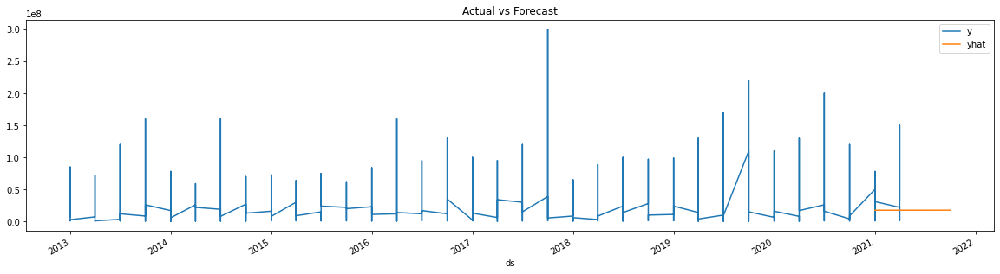

In [105]:
# plotting the actual and forecast values

ax = (df3.plot(x='ds',y='y',figsize=(20,5),title='Actual Vs Forecast'))
forecast.plot(x='ds',y='yhat',figsize=(20,5),title='Actual vs Forecast', ax=ax)

In [106]:
# pd.concat([df1.set_index('ds')['y'], forecast.set_index('ds')['yhat']], axis = 1).plot()

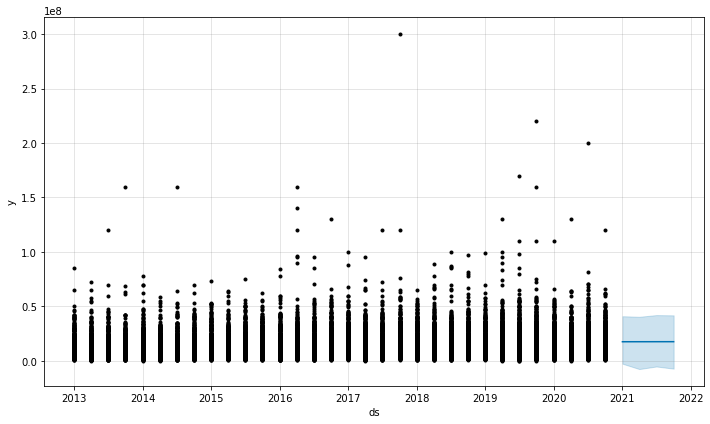

In [107]:
fig1 = basic.plot(forecast)

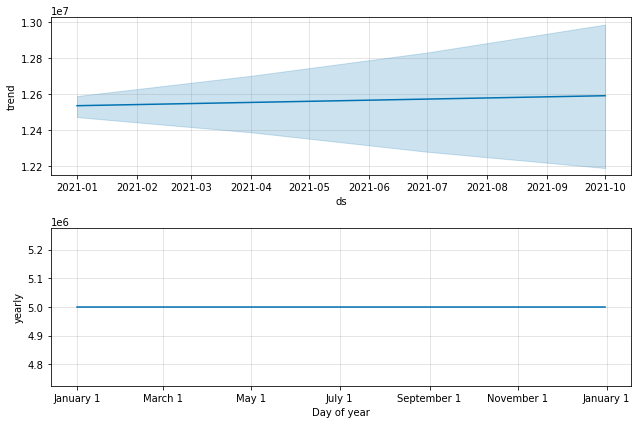

In [108]:
fig2 = basic.plot_components(forecast)

#### Working on the Vector Autoregression (VAR) Model

### Combining Data Source 1,2,3,5

In [109]:
combined2.set_index('ds', inplace = True)

In [110]:
combined.shape

(19895, 2)

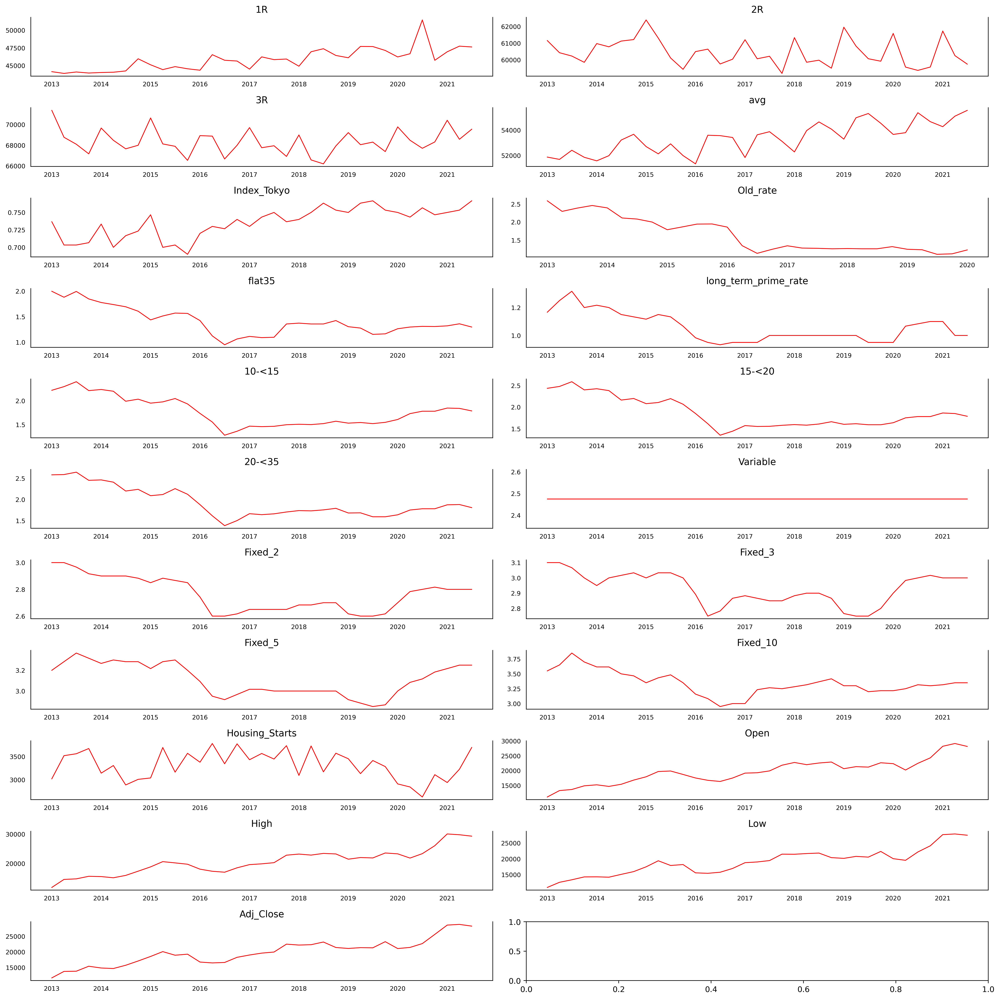

In [320]:
# Plot combined2


fig, axes = plt.subplots(nrows=11, ncols=2, dpi=390, figsize = (18,18) )
for i, ax in enumerate(axes.flatten()):
    try:
        data_df = combined2[combined2.columns[i]]
        ax.plot(data_df, color='red', linewidth=1)
        # Decorations
        ax.set_title(combined2.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=8)
    except: 
        pass
plt.tight_layout();

## Next step would be to get some sort of indexes for home prices

In [112]:
# Bottom_Tier
# Mid_Tier
# Top_Tier

In [113]:
df3

,ds,y
86147,2013-01-01,6800000
86451,2013-01-01,12000000
86450,2013-01-01,8800000
79627,2013-01-01,8000000
79628,2013-01-01,5700000
...,...,...
15780,2021-04-01,16000000
3485,2021-04-01,2100000
25874,2021-04-01,35000000
9862,2021-04-01,11000000


In [114]:
temp = combined.copy()

temp['rank']=temp['y'].rank(method='max')
sz = temp['rank'].size - 1 
temp['pctile_linear'] = temp['rank'].apply(lambda x: 100.0*(x-1)/sz)

In [115]:
temp.pctile_linear.sort_values()

64370      0.000000
3239       0.005027
8027       0.010053
3226       0.020107
77920      0.020107
            ...    
31084     99.979893
18438     99.984920
20278     99.989947
31085     99.994973
17944    100.000000
Name: pctile_linear, Length: 19895, dtype: float64

In [116]:
combined['pctile_linear'] = temp['pctile_linear']

In [117]:
# bottom_tier = df1.loc[df1.pctile_linear >=0.0 and  df1.pctile_linear <= 35.0]

In [118]:
# pd.qcut(df3['y'],[0.05,0.35,0.65,0.95])

In [119]:
# bottom_tier, mid_tier, top_tier 
# df1 = pd.qcut(df1['y'],[0.05,0.35,0.65,0.95], labels=["bottom_tier", "mid_tier", "top_tier"])

In [120]:
combined

,ds,y,pctile_linear
86147,2013-01-01,6800000,24.796421
83846,2013-01-01,17000000,66.673369
83847,2013-01-01,30000000,90.358902
81297,2013-01-01,3000000,7.399216
81294,2013-01-01,4800000,15.698200
...,...,...,...
15122,2021-04-01,14000000,56.077209
16334,2021-04-01,31000000,91.127978
20042,2021-04-01,38000000,95.817835
8095,2021-04-01,3000000,7.399216


In [121]:
temp2 = pd.qcut(combined['y'],[0.05,0.35,0.65,0.95], labels=["bottom_tier", "mid_tier", "top_tier"]).to_frame('Segment')

In [122]:
# must use combined instead of df3, which doesn't have Data Source 2
df4 = pd.merge(combined, temp2, left_index=True, right_index=True).reset_index()

In [123]:
df4

,index,ds,y,pctile_linear,Segment
0,5,2021-04-01,3980000,11.134010,bottom_tier
1,10,2021-04-01,4750000,15.185483,bottom_tier
2,13,2020-04-01,17000000,66.673369,mid_tier
3,13,2020-04-01,17000000,66.673369,bottom_tier
4,13,2021-04-01,3000000,7.399216,mid_tier
...,...,...,...,...,...
19908,94212,2013-07-01,8500000,32.899367,bottom_tier
19909,94213,2013-07-01,12000000,48.150196,mid_tier
19910,94216,2013-04-01,5800000,20.242284,bottom_tier
19911,94225,2013-04-01,13000000,52.121243,mid_tier


In [124]:
df4[df4.Segment == 'bottom_tier']

,index,ds,y,pctile_linear,Segment
0,5,2021-04-01,3980000,11.134010,bottom_tier
1,10,2021-04-01,4750000,15.185483,bottom_tier
3,13,2020-04-01,17000000,66.673369,bottom_tier
5,13,2021-04-01,3000000,7.399216,bottom_tier
8,17,2019-04-01,12000000,48.150196,bottom_tier
...,...,...,...,...,...
19894,94022,2013-01-01,5300000,18.156228,bottom_tier
19896,94026,2013-07-01,6900000,25.098020,bottom_tier
19908,94212,2013-07-01,8500000,32.899367,bottom_tier
19910,94216,2013-04-01,5800000,20.242284,bottom_tier


In [125]:
df4[df4.Segment == 'bottom_tier'][['y']]

,y
0,3980000
1,4750000
3,17000000
5,3000000
8,12000000
...,...
19894,5300000
19896,6900000
19908,8500000
19910,5800000


In [126]:
index = df4['ds']

In [127]:
Bottom_Tier = (df4[df4.Segment == 'bottom_tier'][['y']].groupby(index, axis=0)
                                         .median()
               )

In [128]:
Bottom_Tier

,y
ds,
2013-01-01,5500000.0
2013-04-01,5400000.0
2013-07-01,5000000.0
2013-10-01,5600000.0
2014-01-01,5800000.0
2014-04-01,5400000.0
2014-07-01,5500000.0
2014-10-01,5500000.0
2015-01-01,6100000.0


In [129]:
Mid_Tier = (df4[df4.Segment == 'mid_tier'][['y']].groupby(index, axis=0)
                                         .median()
           )

In [130]:
Mid_Tier

,y
ds,
2013-01-01,13000000.0
2013-04-01,13000000.0
2013-07-01,13000000.0
2013-10-01,13000000.0
2014-01-01,14000000.0
2014-04-01,12500000.0
2014-07-01,13000000.0
2014-10-01,13000000.0
2015-01-01,14000000.0


In [131]:
Top_Tier = (df4[df4.Segment == 'top_tier'][['y']].groupby(index, axis=0)
                                         .median()
           )

In [132]:
Top_Tier

,y
ds,
2013-01-01,23000000.0
2013-04-01,23000000.0
2013-07-01,22000000.0
2013-10-01,21000000.0
2014-01-01,23000000.0
2014-04-01,24000000.0
2014-07-01,22000000.0
2014-10-01,22000000.0
2015-01-01,22000000.0


#### Bottom_Tier

In [133]:
Bottom_Tier.reset_index(inplace=True)
combined2a = pd.concat([ Bottom_Tier.drop(['ds'], axis=1), res3_renamed, res5_renamed.drop(['ds'], axis=1), res6_renamed.drop(['ds'], axis=1)], axis=1)
combined2a.head()



,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,5500000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,5400000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,5000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,5600000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,5800000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667


In [134]:
combined2a = pd.concat([combined2a, res7_renamed.drop(['ds'], axis=1), res8_renamed.drop(['ds'], axis=1) ], axis = 1)
combined2a.head()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
0,5500000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
1,5400000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2,5000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
3,5600000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
4,5800000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [135]:
# trimming combined2a 

future_2a = combined2a[-1:]
combined2a = combined2a[:-1]

In [136]:
future_2a

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
34,NaN,2021-07-01,47635.333333,59746.0,69550.0,55565.0,0.766667,NaN,1.296667,1.0,1.786667,1.786667,1.806667,2.475,2.8,3.0,3.25,3.35,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


In [137]:
combined2a.set_index('ds', inplace = True)

In [138]:
combined2a.shape

(34, 22)

In [139]:
# Plot combined2a


fig, axes = plt.subplots(nrows=11, ncols=2, dpi=390, figsize=(28,28))
for i, ax in enumerate(axes.flatten()):
    try:
        data_df = combined2a[combined2a.columns[i]]
        ax.plot(data_df, color='red', linewidth=1)
        # Decorations
        ax.set_title(combined2a.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=8)
    except: 
        pass
plt.tight_layout();


#### Mid_Tier

In [140]:
Mid_Tier.reset_index(inplace=True)
combined2b = pd.concat([ Mid_Tier.drop(['ds'], axis=1), res3_renamed, res5_renamed.drop(['ds'], axis=1), res6_renamed.drop(['ds'], axis=1)], axis=1)
combined2b.head()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,13000000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,13000000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,13000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,13000000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,14000000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667


In [141]:
combined2b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   y                     34 non-null     float64       
 1   ds                    35 non-null     datetime64[ns]
 2   1R                    35 non-null     float64       
 3   2R                    35 non-null     float64       
 4   3R                    35 non-null     float64       
 5   avg                   35 non-null     float64       
 6   Index_Tokyo           35 non-null     float64       
 7   Old_rate              29 non-null     float64       
 8   flat35                35 non-null     float64       
 9   long_term_prime_rate  35 non-null     float64       
 10  10-<15                35 non-null     float64       
 11  15-<20                35 non-null     float64       
 12  20-<35                35 non-null     float64       
 13  Variable              

In [142]:
combined2b.dropna(how = 'all',inplace = True)

In [143]:
# combined2b = pd.concat([combined2b, res7_renamed.drop(['ds'], axis=1), res8_renamed.drop(['ds'], axis=1) ], axis = 1)
combined2b = combined2b.merge(res7_renamed, on = 'ds', how = 'left').merge(res8_renamed, 
on='ds', how='left')
combined2b.head()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
0,13000000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
1,13000000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2,13000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
3,13000000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
4,14000000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [144]:
combined2b.tail()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
30,13000000.0,2020-07-01,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
31,14000000.0,2020-10-01,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
32,13000000.0,2021-01-01,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
33,13000000.0,2021-04-01,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411
34,NaN,2021-07-01,47635.333333,59746.000000,69550.000000,55565.000000,0.766667,NaN,1.296667,1.000000,1.786667,1.786667,1.806667,2.475,2.800000,3.000000,3.250000,3.350000,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


In [145]:
# combined2b.tail()

future_2b = combined2b[-1:]
combined2b = combined2b[:-1]

In [146]:
future_2b

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
34,NaN,2021-07-01,47635.333333,59746.0,69550.0,55565.0,0.766667,NaN,1.296667,1.0,1.786667,1.786667,1.806667,2.475,2.8,3.0,3.25,3.35,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


In [147]:
combined2b.set_index('ds', inplace = True)

In [148]:
combined2b.shape

(34, 22)

In [149]:
# Plot combined2b


fig, axes = plt.subplots(nrows=11, ncols=2, dpi=390, figsize=(28,28))
for i, ax in enumerate(axes.flatten()):
    try:
        data_df = combined2b[combined2b.columns[i]]
        ax.plot(data_df, color='red', linewidth=1)
        # Decorations
        ax.set_title(combined2b.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=8)
    except: 
        pass
plt.tight_layout();


#### Top_Tier

In [150]:
Top_Tier.reset_index(inplace=True)
combined2c = pd.concat([ Top_Tier.drop(['ds'], axis=1), res3_renamed, res5_renamed.drop(['ds'], axis=1), res6_renamed.drop(['ds'], axis=1)], axis=1)
combined2c.head()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10
0,23000000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000
1,23000000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000
2,22000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000
3,21000000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000
4,23000000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667


In [151]:
combined2c = pd.concat([combined2c, res7_renamed.drop(['ds'], axis=1), res8_renamed.drop(['ds'], axis=1) ], axis = 1)
combined2c.head()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
0,23000000.0,2013-01-01,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
1,23000000.0,2013-04-01,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2,22000000.0,2013-07-01,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
3,21000000.0,2013-10-01,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
4,23000000.0,2014-01-01,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [152]:
combined2c.tail()

,y,ds,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
30,24000000.0,2020-07-01,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
31,25000000.0,2020-10-01,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
32,25000000.0,2021-01-01,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
33,24000000.0,2021-04-01,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411
34,NaN,2021-07-01,47635.333333,59746.000000,69550.000000,55565.000000,0.766667,NaN,1.296667,1.000000,1.786667,1.786667,1.806667,2.475,2.800000,3.000000,3.250000,3.350000,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


In [153]:
combined2c.set_index('ds', inplace = True)

In [154]:
combined2c.shape



(35, 22)

In [155]:
# Plot combined2c


fig, axes = plt.subplots(nrows=11, ncols=2, dpi=390, figsize=(28,28))
for i, ax in enumerate(axes.flatten()):
    try:
        data_df = combined2c[combined2c.columns[i]]
        ax.plot(data_df, color='red', linewidth=1)
        # Decorations
        ax.set_title(combined2c.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=6)
    except: 
        pass
plt.tight_layout();

In [156]:
combined2c.tail()

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2020-07-01,24000000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,25000000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
2021-01-01,25000000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,24000000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411
2021-07-01,NaN,47635.333333,59746.000000,69550.000000,55565.000000,0.766667,NaN,1.296667,1.000000,1.786667,1.786667,1.806667,2.475,2.800000,3.000000,3.250000,3.350000,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


In [157]:
future_2c = combined2c[-1:]
combined2c = combined2c[:-1]

In [158]:
future_2c

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2021-07-01,NaN,47635.333333,59746.0,69550.0,55565.0,0.766667,NaN,1.296667,1.0,1.786667,1.786667,1.806667,2.475,2.8,3.0,3.25,3.35,3698.333333,28168.256511,29309.296875,27468.779948,28275.263021


## Skipping Grangers Causation Hypothesis Test

In [159]:
combined2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35 entries, 2013-01-01 to 2021-07-01
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   1R                    35 non-null     float64
 1   2R                    35 non-null     float64
 2   3R                    35 non-null     float64
 3   avg                   35 non-null     float64
 4   Index_Tokyo           35 non-null     float64
 5   Old_rate              29 non-null     float64
 6   flat35                35 non-null     float64
 7   long_term_prime_rate  35 non-null     float64
 8   10-<15                35 non-null     float64
 9   15-<20                35 non-null     float64
 10  20-<35                35 non-null     float64
 11  Variable              35 non-null     float64
 12  Fixed_2               35 non-null     float64
 13  Fixed_3               35 non-null     float64
 14  Fixed_5               35 non-null     float64
 15  Fixed

In [160]:
def apply_granger(fname, indata):
    maxlag = 4
    test = 'ssr_chi2test'
    g_results = grangercausalitytests(indata[['hyp_rev',fname]], maxlag=maxlag, verbose=False)

In [161]:
# combined2a: Y 
# Casuality Tests: Yes: 1R, 3R, avg, Housing_Starts, Open, High, Low, Adj_Close
# Error: Old_rate
grangercausalitytests(combined2a[['y', 'Adj_Close' ]], maxlag = 10, verbose=True)




Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0555  , p=0.8153  , df_denom=30, df_num=1
ssr based chi2 test:   chi2=0.0611  , p=0.8048  , df=1
likelihood ratio test: chi2=0.0610  , p=0.8049  , df=1
parameter F test:         F=0.0555  , p=0.8153  , df_denom=30, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6428  , p=0.5337  , df_denom=27, df_num=2
ssr based chi2 test:   chi2=1.5237  , p=0.4668  , df=2
likelihood ratio test: chi2=1.4886  , p=0.4751  , df=2
parameter F test:         F=0.6428  , p=0.5337  , df_denom=27, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1921  , p=0.3338  , df_denom=24, df_num=3
ssr based chi2 test:   chi2=4.6193  , p=0.2019  , df=3
likelihood ratio test: chi2=4.3059  , p=0.2303  , df=3
parameter F test:         F=1.1921  , p=0.3338  , df_denom=24, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3178  , p=0.8628  , df_d

{1: ({'ssr_ftest': (0.05553626001978383, 0.8152968831813903, 30.0, 1),
   'ssr_chi2test': (0.06108988602176222, 0.804781550508134, 1),
   'lrtest': (0.06103341064624601, 0.8048699857921469, 1),
   'params_ftest': (0.05553626001981556, 0.8152968831813358, 30.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.6428188729454261, 0.5336667595258375, 27.0, 2),
   'ssr_chi2test': (1.5237188099447136, 0.46679765368115356, 2),
   'lrtest': (1.4885539096920866, 0.4750776783990067, 2),
   'params_ftest': (0.6428188729454267, 0.5336667595258375, 27.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (1.1920746416607817, 0.3338216079227371, 24.0, 3),
   'ssr_chi2test': (4.619289236435529, 0.2018935849582419, 3),
   'lrtest': (4.305903692681795, 0.23027049354948254, 3),
   'params_ftest': (1.1920746416607968, 0.33382160792273174, 24.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 0.

In [341]:
# 3R, Index_Tokyo, Fixed_2, Fixed_10
# Casuality Tests: Yes - combined2a: Y 
grangercausalitytests(combined2a[['Fixed_10', 'y' ]], maxlag = 10, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2210  , p=0.6416  , df_denom=30, df_num=1
ssr based chi2 test:   chi2=0.2431  , p=0.6219  , df=1
likelihood ratio test: chi2=0.2423  , p=0.6226  , df=1
parameter F test:         F=0.2210  , p=0.6416  , df_denom=30, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2615  , p=0.7718  , df_denom=27, df_num=2
ssr based chi2 test:   chi2=0.6198  , p=0.7335  , df=2
likelihood ratio test: chi2=0.6139  , p=0.7357  , df=2
parameter F test:         F=0.2615  , p=0.7718  , df_denom=27, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2616  , p=0.1071  , df_denom=24, df_num=3
ssr based chi2 test:   chi2=8.7635  , p=0.0326  , df=3
likelihood ratio test: chi2=7.7179  , p=0.0522  , df=3
parameter F test:         F=2.2616  , p=0.1071  , df_denom=24, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.6998  , p=0.1877  , df_d

{1: ({'ssr_ftest': (0.2210396813335812, 0.6416488563903839, 30.0, 1),
   'ssr_chi2test': (0.2431436494669393, 0.6219447683461554, 1),
   'lrtest': (0.24225228525057219, 0.6225841073705883, 1),
   'params_ftest': (0.22103968133364418, 0.6416488563903382, 30.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.26148282003040296, 0.7718363690841539, 27.0, 2),
   'ssr_chi2test': (0.6198111289609551, 0.73351622293921, 2),
   'lrtest': (0.6138849388286474, 0.7356929245346165, 2),
   'params_ftest': (0.2614828202930537, 0.7718363688852827, 27.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (2.26156047316275, 0.10708292893375841, 24.0, 3),
   'ssr_chi2test': (8.763546833505657, 0.032605593953292863, 3),
   'lrtest': (7.717864761359294, 0.05221705560621862, 3),
   'params_ftest': (2.261560479936208, 0.10708292817841135, 24.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 0., 0

In [163]:
# combined2b: Y 
# Casuality Tests: Yes: 1R, 2R, 3R, avg, Index_Tokyo, flat35, long_term_prime_rate, Fixed_2, Fixed_3, Fixed_5, 
# Housing_Starts, Open, High, Low, Adj_Close
# Error: Old_rate
grangercausalitytests(combined2b[['y', 'Adj_Close' ]], maxlag = 10, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5057  , p=0.2293  , df_denom=30, df_num=1
ssr based chi2 test:   chi2=1.6563  , p=0.1981  , df=1
likelihood ratio test: chi2=1.6160  , p=0.2036  , df=1
parameter F test:         F=1.5057  , p=0.2293  , df_denom=30, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3621  , p=0.6995  , df_denom=27, df_num=2
ssr based chi2 test:   chi2=0.8583  , p=0.6511  , df=2
likelihood ratio test: chi2=0.8470  , p=0.6548  , df=2
parameter F test:         F=0.3621  , p=0.6995  , df_denom=27, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2878  , p=0.8337  , df_denom=24, df_num=3
ssr based chi2 test:   chi2=1.1153  , p=0.7734  , df=3
likelihood ratio test: chi2=1.0957  , p=0.7781  , df=3
parameter F test:         F=0.2878  , p=0.8337  , df_denom=24, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1618  , p=0.9553  , df_d

{1: ({'ssr_ftest': (1.5056891388013984, 0.22934088326734187, 30.0, 1),
   'ssr_chi2test': (1.6562580526815383, 0.19810931235077542, 1),
   'lrtest': (1.616034929613761, 0.203645547570434, 1),
   'params_ftest': (1.5056891307448372, 0.22934088448331522, 30.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.3620996612366659, 0.6995425679014804, 27.0, 2),
   'ssr_chi2test': (0.8583103081165415, 0.6510589069126469, 2),
   'lrtest': (0.847001201712942, 0.6547507822550713, 2),
   'params_ftest': (0.3620996612366869, 0.6995425679014653, 27.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (0.287817334367278, 0.8337197548150806, 24.0, 3),
   'ssr_chi2test': (1.1152921706732024, 0.7733838343292118, 3),
   'lrtest': (1.0956982184858362, 0.7781126510434108, 3),
   'params_ftest': (0.28781733436725576, 0.8337197548150962, 24.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 0., 0.

In [164]:
combined2b

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13000000.0,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
2013-04-01,13000000.0,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2013-07-01,13000000.0,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
2013-10-01,13000000.0,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
2014-01-01,14000000.0,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555
2014-04-01,12500000.0,44057.333333,60784.000000,68479.000000,51981.666667,0.700000,2.113333,1.736667,1.200000,2.200000,2.383333,2.410000,2.475,2.900000,3.000000,3.300000,3.616667,3307.333333,14663.036459,15117.073242,14209.016602,14699.529948
2014-07-01,13000000.0,44237.333333,61126.666667,67655.666667,53218.000000,0.716667,2.083333,1.693333,1.150000,1.990000,2.163333,2.200000,2.475,2.900000,3.016667,3.283333,3.500000,2887.000000,15381.923177,15920.860026,15098.773437,15739.626302
2014-10-01,13000000.0,45959.333333,61217.000000,67998.333333,53674.000000,0.723333,2.000000,1.606667,1.133333,2.033333,2.200000,2.240000,2.475,2.883333,3.033333,3.283333,3.466667,3008.000000,16793.779622,17361.759766,15971.779622,17108.126302
2015-01-01,14000000.0,45108.666667,62393.666667,70639.000000,52702.666667,0.746667,1.786667,1.436667,1.116667,1.950000,2.080000,2.090000,2.475,2.850000,3.000000,3.216667,3.350000,3038.333333,17910.563151,18831.526693,17480.500000,18559.773437


In [165]:
# 1R, 2R, 3R, avg, Index_Tokyo, flat35, long_term_prime_rate, 10-<15, 15-<20, Fixed_2, Fixed_3, Fixed_5, Fixed_10
# Casuality Tests: Yes - combined2b: Y 
# Error: Old_rate


grangercausalitytests(combined2b[['Fixed_10', 'y' ]], maxlag = 10, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3928  , p=0.5356  , df_denom=30, df_num=1
ssr based chi2 test:   chi2=0.4320  , p=0.5110  , df=1
likelihood ratio test: chi2=0.4292  , p=0.5124  , df=1
parameter F test:         F=0.3928  , p=0.5356  , df_denom=30, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4263  , p=0.6572  , df_denom=27, df_num=2
ssr based chi2 test:   chi2=1.0106  , p=0.6033  , df=2
likelihood ratio test: chi2=0.9949  , p=0.6081  , df=2
parameter F test:         F=0.4263  , p=0.6572  , df_denom=27, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9670  , p=0.4245  , df_denom=24, df_num=3
ssr based chi2 test:   chi2=3.7471  , p=0.2901  , df=3
likelihood ratio test: chi2=3.5374  , p=0.3159  , df=3
parameter F test:         F=0.9670  , p=0.4245  , df_denom=24, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1182  , p=0.3744  , df_d

{1: ({'ssr_ftest': (0.39275999884415475, 0.5355925669505991, 30.0, 1),
   'ssr_chi2test': (0.4320359987285702, 0.5109916021186871, 1),
   'lrtest': (0.42923233495423574, 0.5123658703553003, 1),
   'params_ftest': (0.3927599988442062, 0.5355925669505727, 30.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.4263368146500088, 0.6572155007971832, 27.0, 2),
   'ssr_chi2test': (1.0105761532444653, 0.6033317446188713, 2),
   'lrtest': (0.9949470980231467, 0.6080649670574114, 2),
   'params_ftest': (0.42633681529306544, 0.6572155003874944, 27.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (0.9669886483827609, 0.42446501639754364, 24.0, 3),
   'ssr_chi2test': (3.7470810124831986, 0.2901017908299498, 3),
   'lrtest': (3.5373592950581667, 0.3159489725283286, 3),
   'params_ftest': (0.9669886493918703, 0.42446501594314934, 24.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 0

In [166]:
# combined2c: Y 
# Casuality Tests: Yes: 1R, 3R, avg, 
# Error: y, Old_rate
# Missing values: y, Old_rate
# grangercausalitytests(combined2c[['y', '3R' ]], maxlag = 4, verbose=True)

# combined2c

In [167]:
maxlag=10
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """

    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            try :
                test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
                p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
                if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
                min_p_value = np.min(p_values)
                df.loc[r, c] = min_p_value
            except:
                pass

                
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

grangers_causation_matrix(combined2, variables = combined2.columns)

,1R_x,2R_x,3R_x,avg_x,Index_Tokyo_x,Old_rate_x,flat35_x,long_term_prime_rate_x,10-<15_x,15-<20_x,20-<35_x,Variable_x,Fixed_2_x,Fixed_3_x,Fixed_5_x,Fixed_10_x,Housing_Starts_x,Open_x,High_x,Low_x,Adj_Close_x
1R_y,1.0000,0.0005,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0013,0.0089,0.0084,0.0,0.0038,0.0000,0.0000,0.0000,0.0000,0.0000,0.0001,0.0013,0.0002
2R_y,0.0000,1.0000,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0002,0.0000,0.0000,0.0149,0.0000,0.0000,0.0000,0.0000
3R_y,0.0000,0.0217,1.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
avg_y,0.0000,0.0000,0.0000,1.0000,0.000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0003,0.0004,0.0000,0.0017
Index_Tokyo_y,0.0001,0.0000,0.0000,0.0000,1.000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000
Old_rate_y,0.0000,0.0000,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
flat35_y,0.0000,0.0000,0.0007,0.0000,0.000,0.0,1.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
long_term_prime_rate_y,0.0250,0.0000,0.0000,0.0753,0.000,0.0,0.0000,1.0000,0.0039,0.0005,0.0000,0.0,0.0000,0.0000,0.0000,0.2122,0.0000,0.0000,0.0000,0.0000,0.0000
10-<15_y,0.0000,0.0000,0.0000,0.0000,0.000,0.0,0.0000,0.0006,1.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
15-<20_y,0.0000,0.0000,0.0000,0.0000,0.000,0.0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [168]:
# combined2c.info()
combined2c.columns

Index(['y', '1R', '2R', '3R', 'avg', 'Index_Tokyo', 'Old_rate', 'flat35',
       'long_term_prime_rate', '10-<15', '15-<20', '20-<35', 'Variable',
       'Fixed_2', 'Fixed_3', 'Fixed_5', 'Fixed_10', 'Housing_Starts', 'Open',
       'High', 'Low', 'Adj_Close'],
      dtype='object')

In [169]:
# combined2.reset_index(inplace = True)
# combined2a.reset_index(inplace = True)
# combined2b.reset_index(inplace = True)
# combined2c.reset_index(inplace = True)
combined2c

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,23000000.0,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
2013-04-01,23000000.0,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2013-07-01,22000000.0,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
2013-10-01,21000000.0,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
2014-01-01,23000000.0,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555
2014-04-01,24000000.0,44057.333333,60784.000000,68479.000000,51981.666667,0.700000,2.113333,1.736667,1.200000,2.200000,2.383333,2.410000,2.475,2.900000,3.000000,3.300000,3.616667,3307.333333,14663.036459,15117.073242,14209.016602,14699.529948
2014-07-01,22000000.0,44237.333333,61126.666667,67655.666667,53218.000000,0.716667,2.083333,1.693333,1.150000,1.990000,2.163333,2.200000,2.475,2.900000,3.016667,3.283333,3.500000,2887.000000,15381.923177,15920.860026,15098.773437,15739.626302
2014-10-01,22000000.0,45959.333333,61217.000000,67998.333333,53674.000000,0.723333,2.000000,1.606667,1.133333,2.033333,2.200000,2.240000,2.475,2.883333,3.033333,3.283333,3.466667,3008.000000,16793.779622,17361.759766,15971.779622,17108.126302
2015-01-01,22000000.0,45108.666667,62393.666667,70639.000000,52702.666667,0.746667,1.786667,1.436667,1.116667,1.950000,2.080000,2.090000,2.475,2.850000,3.000000,3.216667,3.350000,3038.333333,17910.563151,18831.526693,17480.500000,18559.773437


In [170]:
grangers_causation_matrix(combined2c, variables = combined2c.columns)

,y_x,1R_x,2R_x,3R_x,avg_x,Index_Tokyo_x,Old_rate_x,flat35_x,long_term_prime_rate_x,10-<15_x,15-<20_x,20-<35_x,Variable_x,Fixed_2_x,Fixed_3_x,Fixed_5_x,Fixed_10_x,Housing_Starts_x,Open_x,High_x,Low_x,Adj_Close_x
y_y,1.0,0.0000,0.0000,0.0,0.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
1R_y,0.0,1.0000,0.0000,0.0,0.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0001,0.0000,0.0015
2R_y,0.0,0.0000,1.0000,0.0,0.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0001,0.0000,0.0000,0.017,0.0000,0.0000,0.0000,0.0000
3R_y,0.0,0.0000,0.0071,1.0,0.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
avg_y,0.0,0.0000,0.0000,0.0,1.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0008,0.0011,0.0000,0.0045
Index_Tokyo_y,0.0,0.0000,0.0000,0.0,0.000,1.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
Old_rate_y,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
flat35_y,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0,1.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
long_term_prime_rate_y,0.0,0.0042,0.0000,0.0,0.061,0.0,0.0,0.0000,1.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0029,0.000,0.0000,0.0000,0.0000,0.0000
10-<15_y,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0,0.0000,0.0006,1.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000


In [171]:
# combined2c: Y 
# Casuality Tests: Yes: 1R, 2R, 3R, avg, Index_Tokyo, flat35, long_term_prime_rate, 10-<15, 15-<20, 20-<35,
# Fixed_2, Fixed_3, Fixed_5, Fixed_10, Housing_Starts, Open, High, Low, Adj_Close
# Error: Old_rate
grangercausalitytests(combined2c[['y', 'Adj_Close' ]], maxlag = 10, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5701  , p=0.0408  , df_denom=30, df_num=1
ssr based chi2 test:   chi2=5.0272  , p=0.0250  , df=1
likelihood ratio test: chi2=4.6792  , p=0.0305  , df=1
parameter F test:         F=4.5701  , p=0.0408  , df_denom=30, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1396  , p=0.1372  , df_denom=27, df_num=2
ssr based chi2 test:   chi2=5.0716  , p=0.0792  , df=2
likelihood ratio test: chi2=4.7077  , p=0.0950  , df=2
parameter F test:         F=2.1396  , p=0.1372  , df_denom=27, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9658  , p=0.4250  , df_denom=24, df_num=3
ssr based chi2 test:   chi2=3.7426  , p=0.2906  , df=3
likelihood ratio test: chi2=3.5334  , p=0.3165  , df=3
parameter F test:         F=0.9658  , p=0.4250  , df_denom=24, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3042  , p=0.8718  , df_d

{1: ({'ssr_ftest': (4.5701407972156245, 0.04079935487538888, 30.0, 1),
   'ssr_chi2test': (5.027154876937187, 0.024952857199331588, 1),
   'lrtest': (4.679167187577832, 0.03053054617683948, 1),
   'params_ftest': (4.5701407908683915, 0.04079935500583239, 30.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (2.1395989880774855, 0.13723348631211016, 27.0, 2),
   'ssr_chi2test': (5.071642045813299, 0.07919667028460019, 2),
   'lrtest': (4.707725094258194, 0.09500150483590589, 2),
   'params_ftest': (2.139598988077475, 0.13723348631211135, 27.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (0.9658377325089319, 0.42498355950228484, 24.0, 3),
   'ssr_chi2test': (3.742621213472111, 0.2906311599199668, 3),
   'lrtest': (3.533380179733058, 0.31645855942633455, 3),
   'params_ftest': (0.9658377325089326, 0.4249835595022844, 24.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 0.

In [172]:
# don't have to do the reverse as everything was proved to have casuality on y

## Cointegration Test

In [173]:
combined2a.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 34 entries, 2013-01-01 to 2021-04-01
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   y                     34 non-null     float64
 1   1R                    34 non-null     float64
 2   2R                    34 non-null     float64
 3   3R                    34 non-null     float64
 4   avg                   34 non-null     float64
 5   Index_Tokyo           34 non-null     float64
 6   Old_rate              29 non-null     float64
 7   flat35                34 non-null     float64
 8   long_term_prime_rate  34 non-null     float64
 9   10-<15                34 non-null     float64
 10  15-<20                34 non-null     float64
 11  20-<35                34 non-null     float64
 12  Variable              34 non-null     float64
 13  Fixed_2               34 non-null     float64
 14  Fixed_3               34 non-null     float64
 15  Fixed

In [174]:
def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

        
        
# Housing_Starts, Open, High, Low, Adj_Close

subset = combined2a.drop(['Old_rate', 'Variable', 'Adj_Close', 'Low', 'High', 'Housing_Starts', 'Fixed_10'], axis=1).columns
# Test_2a
test_2a = combined2a.loc[:,subset]
# test_2a.info()
cointegration_test(test_2a)
# Test_2b
test_2b = combined2b.loc[:,subset]

cointegration_test(test_2b)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
y      ::  nan       > nan       =>   False
1R     ::  nan       > nan       =>   False
2R     ::  722.71    > nan       =>   False
3R     ::  517.06    > 311.1288  =>   True
avg    ::  353.89    > 263.2603  =>   True
Index_Tokyo ::  251.25    > 219.4051  =>   True
flat35 ::  168.01    > 179.5199  =>   False
long_term_prime_rate ::  111.84    > 143.6691  =>   False
10-<15 ::  63.65     > 111.7797  =>   False
15-<20 ::  42.17     > 83.9383   =>   False
20-<35 ::  25.37     > 60.0627   =>   False
Fixed_2 ::  11.44     > 40.1749   =>   False
Fixed_3 ::  5.58      > 24.2761   =>   False
Fixed_5 ::  1.84      > 12.3212   =>   False
Open   ::  0.01      > 4.1296    =>   False
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
y      ::  nan       > nan       =>   False
1R     ::  nan       > nan       =>   False
2R     ::  856.31    > nan       =>   False
3R     ::  

In [175]:
combined2c.tail()

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,24000000.0,46673.333333,59568.333333,68483.666667,53801.333333,0.743333,NaN,1.296667,1.066667,1.730000,1.750000,1.750000,2.475,2.783333,2.983333,3.083333,3.250000,2843.333333,20196.326823,21835.726562,19541.753255,21453.240234
2020-07-01,24000000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,25000000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
2021-01-01,25000000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,24000000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411


In [176]:
#have to additionally remove Fixed_5 and Fixed_10 as it produces a matrix that is not positive definite, i.e. an error \
# called LinAlgError while trying to compute Cholesky decomposition

subset = combined2c.drop(['Old_rate', 'Variable', 'Fixed_10', 'Fixed_5', 'Open', 'Adj_Close'], axis=1).columns

test_2c = combined2c.loc[:,subset]

cointegration_test(test_2c)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
y      ::  nan       > nan       =>   False
1R     ::  nan       > nan       =>   False
2R     ::  nan       > nan       =>   False
3R     ::  1196.0    > nan       =>   False
avg    ::  593.66    > 311.1288  =>   True
Index_Tokyo ::  421.11    > 263.2603  =>   True
flat35 ::  279.79    > 219.4051  =>   True
long_term_prime_rate ::  199.4     > 179.5199  =>   True
10-<15 ::  131.04    > 143.6691  =>   False
15-<20 ::  75.01     > 111.7797  =>   False
20-<35 ::  40.54     > 83.9383   =>   False
Fixed_2 ::  13.88     > 60.0627   =>   False
Fixed_3 ::  5.95      > 40.1749   =>   False
Housing_Starts ::  2.63      > 24.2761   =>   False
High   ::  0.36      > 12.3212   =>   False
Low    ::  0.0       > 4.1296    =>   False


## Splitting train and test again

In [177]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)
combined2a.tail()


,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,5850000.0,46673.333333,59568.333333,68483.666667,53801.333333,0.743333,NaN,1.296667,1.066667,1.730000,1.750000,1.750000,2.475,2.783333,2.983333,3.083333,3.250000,2843.333333,20196.326823,21835.726562,19541.753255,21453.240234
2020-07-01,5800000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,5400000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
2021-01-01,5300000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,5200000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411


In [178]:
def train_test_split(df, date = '2021-01-01'):
    msk = df.index < date
    train = df[msk]
    test = df[~msk]
    print(f'''Train's dimension is: {train.shape}''')
    print(f'''Test's dimension is: {test.shape}''')
    return train, test

# Start of combined2a

In [179]:
# msk = combined2a.index <'2021-01-01'

# train = combined2a[msk] 

# train, test = train_test_split(combined2a)
train, test = train_test_split(combined2a,'20Q1')
train.head()

Train's dimension is: (28, 22)
Test's dimension is: (6, 22)


,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,5500000.0,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,2.436667,2.583333,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
2013-04-01,5400000.0,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,2.480000,2.590000,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2013-07-01,5000000.0,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,2.590000,2.646667,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
2013-10-01,5600000.0,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,2.400000,2.453333,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
2014-01-01,5800000.0,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,2.426667,2.463333,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [180]:
# test = combined2a[~msk]
test

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,15-<20,20-<35,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,,
2020-01-01,6000000.0,46221.000000,61584.000000,69777.666667,53662.000000,0.750000,1.225,1.263333,0.950000,1.606667,1.636667,1.636667,2.475,2.700000,2.900000,3.000000,3.216667,2909.000000,22347.939453,23277.032552,20055.846680,21088.383464
2020-04-01,5850000.0,46673.333333,59568.333333,68483.666667,53801.333333,0.743333,NaN,1.296667,1.066667,1.730000,1.750000,1.750000,2.475,2.783333,2.983333,3.083333,3.250000,2843.333333,20196.326823,21835.726562,19541.753255,21453.240234
2020-07-01,5800000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,1.780000,1.780000,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,5400000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,1.780000,1.780000,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
2021-01-01,5300000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,1.863333,1.873333,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,5200000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,1.850000,1.880000,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411


In [181]:
# train.shape

In [182]:
# test.shape

In [183]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")    

In [184]:
# train.head

In [185]:
# From Granger Casuality Test
# combined2a: 1R, 3R, avg, Index_Tokyo, Fixed_2, Fixed_10 

# From Co-integration Test
# 3R     ::  841.92    > 311.1288  =>   True
# avg    ::  589.75    > 263.2603  =>   True
# Index_Tokyo ::  398.47    > 219.4051  =>   True
# flat35 ::  278.95    > 179.5199  =>   True
# long_term_prime_rate ::  205.04    > 143.6691  =>   True
# 10-<15 ::  136.17    > 111.7797  =>   True
# 15-<20 ::  88.34     > 83.9383   =>   True


# have to additionally remove Fixed_2 and Fixed_10 as it produces a matrix that is not positive definite, i.e. an error \
# called LinAlgError while trying to compute Cholesky decomposition

# horizon = 6: removed 1R because 1R went back to non-stationary after 1 differencing
df_train = train[[ 'y', '3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '10-<15', '15-<20', 'Housing_Starts', 
                 'Open', 'High', 'Low', 'Adj_Close'
                 ]]




In [186]:
# ADF Test on each column
for name, column in df_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.7564
 No. Lags Chosen       = 3
 Critical value 1%     = -3.738
 Critical value 5%     = -2.992
 Critical value 10%    = -2.636
 => P-Value = 0.0648. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.1785
 No. Lags Chosen       = 7
 Critical value 1%     = -3.809
 Critical value 5%     = -3.022
 Critical value 10%    = -2.651
 => P-Value = 0.6828. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "avg" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. No

The ADF test confirms not all of the time series is stationary. Let’s difference all of them once and check again.

In [187]:
# 1st difference
df_differenced = df_train.diff().dropna()

Re-run ADF test on each differenced series.

In [188]:
# ADF Test on each column of 1st Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.2487
 No. Lags Chosen       = 3
 Critical value 1%     = -3.753
 Critical value 5%     = -2.998
 Critical value 10%    = -2.639
 => P-Value = 0.0173. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.3889
 No. Lags Chosen       = 6
 Critical value 1%     = -3.809
 Critical value 5%     = -3.022
 Critical value 10%    = -2.651
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "avg" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Te

After the first difference, not all series is stationary. 
Let's difference all the series one more time.

In [189]:
# Second Differencing
df_differenced = df_differenced.diff().dropna()

In [190]:
# ADF Test on each column of 2nd Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -9.3531
 No. Lags Chosen       = 1
 Critical value 1%     = -3.738
 Critical value 5%     = -2.992
 Critical value 10%    = -2.636
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.3898
 No. Lags Chosen       = 6
 Critical value 1%     = -3.833
 Critical value 5%     = -3.031
 Critical value 10%    = -2.656
 => P-Value = 0.0003. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "avg" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Te

All the series are now stationary.

To select the right order of the VAR model, we iteratively fit increasing orders of VAR model and pick the order that gives a model with least AIC.

In [191]:
model = VAR(df_differenced)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe, '\n')
#     print('HQIC: ', result.hqic, )

Lag Order = 1
AIC :  7.1148567599553
FPE :  8172.413982140304 

Lag Order = 2
AIC :  -554.1201762716915
FPE :  -4.379126755505288e-238 

Lag Order = 3
AIC :  -695.7346240701258
FPE :  -4.05405617e-315 

Lag Order = 4
AIC :  -660.8281183810375
FPE :  -6.18674207989087e-310 

Lag Order = 5
AIC :  -655.9358887572173
FPE :  -2.315656e-317 

Lag Order = 6
AIC :  -632.8831678298968
FPE :  -2.9006056e-317 

Lag Order = 7
AIC :  -613.091894680271
FPE :  -2.68535e-319 

Lag Order = 8
AIC :  -592.3254234052367
FPE :  -8.9e-322 

Lag Order = 9
AIC :  -569.8651931112729
FPE :  -0.0 

Lag Order = 10
AIC :  -544.6749391654201
FPE :  -0.0 

Lag Order = 11
AIC :  -519.688608669316
FPE :  -0.0 

Lag Order = 12
AIC :  -482.71890738118566
FPE :  -0.0 

Lag Order = 13
AIC :  -452.1488990989967
FPE :  -0.0 

Lag Order = 14
AIC :  -432.9714274798515
FPE :  -0.0 



In the above output, the AIC drops to lowest at lag 3, then increases at lag 4 and then increases back to -432 level

Let’s go with the lag 3 model.

In [192]:
# x = model.select_order(maxlags=2)
# x.summary()

In [193]:
model_fitted = model.fit(3)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:27:41
---------------------------------------------------------------------
No. of Equations:         13.0000    BIC:                    -670.063
Nobs:                     23.0000    HQIC:                   -689.278
Log likelihood:           8096.69    FPE:               -4.05406e-315
AIC:                     -695.735    Det(Omega_mle):    -8.22619e-321
---------------------------------------------------------------------
Results for equation y
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                         -67.705110              NAN              NAN             NAN
L1.y                           -0.059957         0.000001      -106619.333           0.000
L1.3R             

In [194]:
def adjust(val, length= 6): return str(val).ljust(length)
out = durbin_watson(model_fitted.resid)


for col, val in zip(df_train.columns, out):
    print(adjust(col), ':', round(val, 2))

y      : 2.57
3R     : 2.35
avg    : 1.85
Index_Tokyo : 1.44
flat35 : 1.77
long_term_prime_rate : 1.63
10-<15 : 1.73
15-<20 : 3.24
Housing_Starts : 2.23
Open   : 1.72
High   : 2.15
Low    : 2.02
Adj_Close : 2.7


Since we would like Durbin Watson (DW) statistic to be close to 2, we decided to remove 15-<20 because its deviation from 2 is more than 1. The interpretation is there is no significant serial correlation with the residuals. In other words, there isn't any leftover pattern in the residuals (errors).

In [195]:
# df_train2a = train[[ 'y', '1R', '3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '15-<20']]
# df_train2a = train[['y', '1R', '3R', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '15-<20']]
df_train2a = train[['y', '3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '10-<15',  'Housing_Starts', 
                 'Open', 'High', 'Low', 'Adj_Close']]

#### The columns that need to be dropped in order to keep the matrix to be poisitive definite.
1R, avg, Index_Tokyo, 10-<15, Housing_Starts, Open, High, Low

In [196]:
# df_differenced1 = df_differenced[[ 'y',  'Index_Tokyo', 'flat35', 'long_term_prime_rate', '15-<20']]

# df_differenced1 = df_differenced[['y', '1R', '3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '10-<15', '15-<20', 'Housing_Starts', 
#                  'Open', 'High',  'Adj_Close']]
# df_differenced1 = df_differenced[['y',  '3R',  'flat35', 'long_term_prime_rate', 'Adj_Close']]


# horizon: 6 dropped: 'Adj_Close', 'avg', 'flat35', 'Low', 'High', 'Housing_Starts', '10-<15', 'Open'
df_differenced1 = df_differenced[['y', '3R', 'Index_Tokyo',  'long_term_prime_rate']]

In [197]:
df_differenced1

,y,3R,Index_Tokyo,long_term_prime_rate
ds,,,,
2013-07-01,-300000.0,1929.000000,0.033333,-1.666667e-02
2013-10-01,1000000.0,-255.333333,0.003333,-1.833333e-01
2014-01-01,-400000.0,3423.000000,0.023333,1.333333e-01
2014-04-01,-600000.0,-3679.666667,-0.060000,-3.333333e-02
2014-07-01,500000.0,362.000000,0.050000,-3.333333e-02
2014-10-01,-100000.0,1166.000000,-0.010000,3.333333e-02
2015-01-01,600000.0,2298.000000,0.016667,-2.220446e-16
2015-04-01,-700000.0,-5150.666667,-0.070000,5.000000e-02
2015-07-01,-100000.0,2279.666667,0.050000,-5.000000e-02


In [198]:
model = VAR(df_differenced1)
# model = VARMAX(df_differenced1)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
#     print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  28.77510669417
FPE :  3208957155471.375
Lag Order = 2
AIC :  26.801913499438797
FPE :  509014805701.39105
Lag Order = 3
AIC :  23.906108368463144
FPE :  44028571829.20972
Lag Order = 4
AIC :  21.309390896357243
FPE :  13746741474.775585
Lag Order = 5
AIC :  -inf
FPE :  inf
Lag Order = 6
AIC :  -132.74586215248428
FPE :  6.656252533366543e-59
Lag Order = 7
AIC :  -135.98655610737057
FPE :  2.310946114657407e-62
Lag Order = 8
AIC :  -138.31047888789598
FPE :  4.884110674111942e-65
Lag Order = 9
AIC :  -197.23564914928923
FPE :  3.2008672615525e-92
Lag Order = 10
AIC :  -198.5977577608925
FPE :  1.9001688533600732e-94
Lag Order = 11
AIC :  -201.74678621620401
FPE :  1.4572579107244827e-97
Lag Order = 12
AIC :  -198.77120316794728
FPE :  3.432478534645828e-98
Lag Order = 13
AIC :  -209.89228498237404
FPE :  3.5497114491922844e-105
Lag Order = 14
AIC :  -205.11055798262413
FPE :  1.448680063841923e-105
Lag Order = 15
AIC :  -203.53143931813952
FPE :  9.418603375127505e-

### Re-do the model fitting with lag 13

In [199]:
model_fitted = model.fit(maxlags = 13)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:27:42
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -200.679
Nobs:                     13.0000    HQIC:                  -211.786
Log likelihood:           1502.52    FPE:               3.54971e-105
AIC:                     -209.892    Det(Omega_mle):    5.34307e-108
--------------------------------------------------------------------
Results for equation y
                              coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------
const                           -0.000426         0.033856           -0.013           0.990
L1.y                            -0.313516         0.000000     -7708612.135           0.000
L1.3R               

In [200]:
# Get the lag order
lag_order = model_fitted.k_ar
print(lag_order)

# Input data for forecasting
forecast_input = df_differenced1.values[-lag_order:]
forecast_input

13


array([[ 7.00000000e+05,  3.53366667e+03,  1.66666667e-02,
         3.33333333e-02],
       [ 3.00000000e+05,  3.88333333e+02, -2.33333333e-02,
        -1.66666667e-02],
       [-1.00000000e+06, -3.65533333e+03,  2.33333333e-02,
         0.00000000e+00],
       [ 1.40000000e+06,  2.13266667e+03, -6.66666667e-03,
         5.00000000e-02],
       [-6.00000000e+05, -1.22166667e+03, -2.00000000e-02,
        -5.00000000e-02],
       [-1.00000000e+06,  3.11033333e+03,  1.66666667e-02,
         0.00000000e+00],
       [ 1.00000000e+06, -4.49266667e+03,  6.66666667e-03,
         0.00000000e+00],
       [-8.00000000e+05,  2.03533333e+03,  3.33333333e-03,
         0.00000000e+00],
       [ 4.50000000e+05,  2.11133333e+03, -2.33333333e-02,
         0.00000000e+00],
       [ 3.00000000e+05, -4.41333333e+02,  6.66666667e-03,
         0.00000000e+00],
       [-4.50000000e+05, -2.45600000e+03,  1.66666667e-02,
         0.00000000e+00],
       [-1.00000000e+05,  1.41433333e+03, -1.00000000e-02,
      

Like train, we need to subset the test dataframe to just the columns

In [201]:
# test_2a = test[['y', '1R',  'avg', 'Index_Tokyo']]
# test_2a = test[['y', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '15-<20']]
# test_2a = test[['y',  '3R',  'flat35', 'long_term_prime_rate',  'Adj_Close']]
test_2a = test[['y', '3R', 'Index_Tokyo',  'long_term_prime_rate']]
test_2a.shape

(6, 4)

In [202]:
nobs = 6
# Forecast
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
# df_forecast = pd.DataFrame(fc, index=df_differenced.index[-nobs:], columns=df_differenced.columns + '_2d')
df_forecast = pd.DataFrame(fc, index=test_2a.index, columns=test_2a.columns + '_2d')
df_forecast

,y_2d,3R_2d,Index_Tokyo_2d,long_term_prime_rate_2d
ds,,,,
2020-01-01,-2.277682e+06,-3688.832446,0.005148,-0.021813
2020-04-01,2.400136e+06,-492.232355,0.049246,0.123909
2020-07-01,3.316667e+06,11155.130711,-0.043965,0.132060
2020-10-01,-2.661732e+06,4227.355185,-0.013726,-0.159208
2021-01-01,1.386937e+06,2669.009112,0.040664,-0.080905
2021-04-01,-5.038503e+06,-16095.375782,-0.054323,-0.361242


The forecasts are generated but it is on the scale of the training data used by the model. So, to bring it back up to its original scale, I need to de-difference it as many times I had differenced the original data.

In [203]:
# make predictions

# nobs = 4

# pred = model_fitted.forecast(forecast_input, steps=nobs)
# pred = pd.DataFrame(pred, columns = test_2a.columns+ '_pred')
# print(pred)

#### Invert the transformation by de-differencing the data 2 times

In [204]:
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [205]:
df_results = invert_transformation(test_2a, df_forecast, second_diff=True)        
# df_results.loc[:, ['y_forecast', '3R_forecast',  'flat35_forecast', 'long_term_prime_rate_forecast',  'Adj_Close_forecast']]
df_results.loc[:, ['y_forecast', '3R_forecast',  'Index_Tokyo_forecast', 'long_term_prime_rate_forecast']]

,y_forecast,3R_forecast,Index_Tokyo_forecast,long_term_prime_rate_forecast
ds,,,,
2020-01-01,2.822318e+06,63048.167554,0.761815,0.878187
2020-04-01,2.844771e+06,57027.769420,0.819542,0.880284
2020-07-01,6.183892e+06,62162.501997,0.833304,1.014441
2020-10-01,6.861281e+06,71524.589759,0.833340,0.989390
2021-01-01,8.925607e+06,83555.686633,0.874041,0.883433
2021-04-01,5.951430e+06,79491.407725,0.860419,0.416233


#### The forecasts are back to the original scale. Let’s plot the forecasts against the actuals from test data.

## Plot of Forecast vs Actuals

In [206]:
len(test_2a.columns)/2

2.0

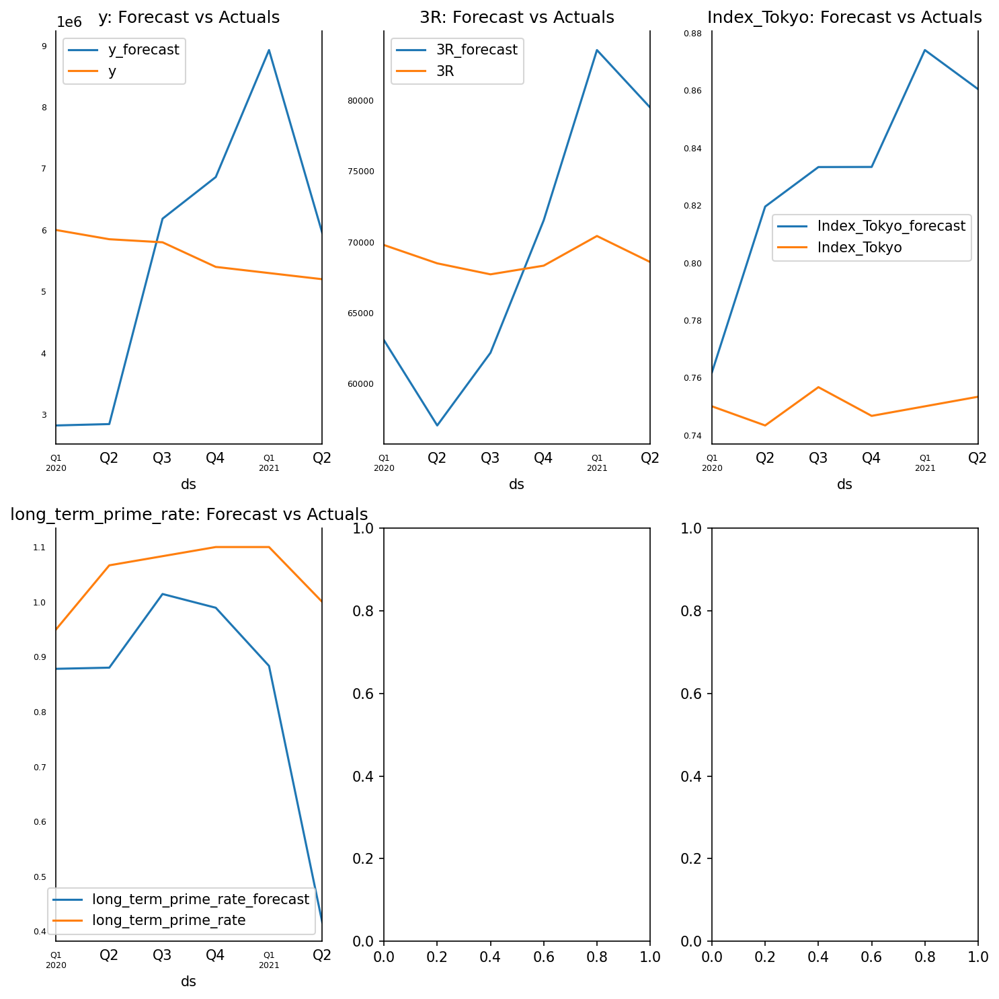

In [207]:
fig, axes = plt.subplots(nrows=int(len(test_2a.columns)/2), ncols=3, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(test_2a.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    test_2a[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [208]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: y')
accuracy_prod = forecast_accuracy(df_results['y_forecast'].values, test_2a['y'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: 3R')
accuracy_prod = forecast_accuracy(df_results['3R_forecast'].values, test_2a['3R'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Index_Tokyo')
accuracy_prod = forecast_accuracy(df_results['Index_Tokyo_forecast'].values, test_2a['Index_Tokyo'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))
    
# print('\nForecast Accuracy of: flat35')
# accuracy_prod = forecast_accuracy(df_results['flat35_forecast'].values, test_2a['flat35'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: long_term_prime_rate')
accuracy_prod = forecast_accuracy(df_results['long_term_prime_rate_forecast'].values, test_2a['long_term_prime_rate'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: 15-<20')
# accuracy_prod = forecast_accuracy(df_results['15-<20_forecast'].values, test_2a['15-<20'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: Adj_Close')
# accuracy_prod = forecast_accuracy(df_results['Adj_Close_forecast'].values, test_2a['Adj_Close'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: Fixed_10')
# accuracy_prod = forecast_accuracy(df_results['Fixed_10_forecast'].values, test_2a['Fixed_10'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))


Forecast Accuracy of: y
mape   :  0.3681
me     :  6549.76
mae    :  2067520.0745
mpe    :  0.0203
rmse   :  2419416.2248
corr   :  -0.776
minmax :  0.3085

Forecast Accuracy of: 3R
mape   :  0.123
me     :  588.465
mae    :  8498.2075
mpe    :  0.0078
rmse   :  9213.4712
corr   :  0.4741
minmax :  0.1142

Forecast Accuracy of: Index_Tokyo
mape   :  0.1072
me     :  0.0804
mae    :  0.0804
mpe    :  0.1072
rmse   :  0.0877
corr   :  0.1975
minmax :  0.0951

Forecast Accuracy of: long_term_prime_rate
mape   :  0.1992
me     :  -0.2063
mae    :  0.2063
mpe    :  -0.1992
rmse   :  0.2722
corr   :  0.5004
minmax :  0.1992


In [209]:
# Input data for forecasting
len(df_differenced1.values[-lag_order:])

13

In [210]:
# Input data for forecasting
forecast_input = df_differenced1.values[-lag_order:]
forecast_input

# make predictions

nobs = 36

pred = model_fitted.forecast(forecast_input, steps=nobs)
pred = pd.DataFrame(pred, columns = test_2a.columns+ '_2d')

dates = pd.date_range('2013-01-01', periods=36, freq='Q-DEC').to_period().asfreq('D', 's')
pred.index = dates

# combined2a

In [211]:
# pred

In [212]:
# quarters = generate_quarters('2021-01-01', '2021-10-01')

<AxesSubplot:xlabel='ds'>

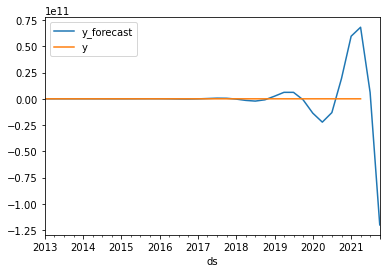

In [213]:
df_results = invert_transformation(test_2a, pred, second_diff=True) 

for i, (col,ax) in enumerate(zip(test_2a.columns[0], axes.flatten())):
    df_results['y_forecast'].plot(legend=True).autoscale(axis='x',tight=True)
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
combined2a['y'].plot(legend=True)

## Time series forecasting with PyCaret Regression Module

In [214]:
# combined2a

data2a = combined2a.reset_index()

# extract month and year from dates
data2a['Quarter'] = [i.quarter for i in data2a['ds']]

# data2a['Month'] = [i.month for i in data2a['Date']]
data2a['Year'] = [i.year for i in data2a['ds']]

# create a sequence of numbers
data2a['Series'] = np.arange(1,len(data2a)+1)

# drop unnecessary columns and re-arrange
data2a.drop(['ds'], axis=1, inplace=True)
data2a = data2a[['Series', 'Year', 'Quarter', 'y']] 
# check the head of the dataset
data2a.head(16)

,Series,Year,Quarter,y
0,1,2013,1,5500000.0
1,2,2013,2,5400000.0
2,3,2013,3,5000000.0
3,4,2013,4,5600000.0
4,5,2014,1,5800000.0
5,6,2014,2,5400000.0
6,7,2014,3,5500000.0
7,8,2014,4,5500000.0
8,9,2015,1,6100000.0
9,10,2015,2,6000000.0


In [215]:
# split data into train-test set
train2a = data2a[data2a['Year'] < 2020]
test2a = data2a[data2a['Year'] >= 2020]
# check shape
train2a.shape, test2a.shape


((28, 4), (6, 4))

In [216]:
# initialize setup
# s = setup(data = train2a, test_data = test2a, target = 'y', fold_strategy = 'timeseries', numeric_features = ['Year', 'Series'], fold = 3, transform_target = False, session_id = 168)


s = setup(data = train2a, test_data = test2a, target = 'y', fold_strategy = 'timeseries',  fold = 9, transform_target = False, session_id = 168)
# lr = create_model('lr')
# tuned_lr = tune_model(lr, n_iter = 51)


,Description,Value
0,session_id,168
1,Target,y
2,Original Data,"(28, 4)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(28, 11)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Series'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='y',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

In [217]:
best2a = compare_models(sort = 'RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lasso,Lasso Regression,280092.6111,168773349248.0000,312126.0660,-41.8368,0.0528,0.0465,0.0111
knn,K Neighbors Regressor,311666.6667,159472219249.7778,321741.2552,-11.1378,0.0548,0.0513,0.0522
en,Elastic Net,306224.9167,161629089166.2222,322020.5538,-7.2506,0.0548,0.0505,0.0178
ridge,Ridge Regression,304851.1389,163124039224.8889,322710.8333,-21.9510,0.0548,0.0503,0.0300
lightgbm,Light Gradient Boosting Machine,315249.1182,171040556686.8832,333994.1313,-6.8246,0.0569,0.0520,0.0233
br,Bayesian Ridge,315249.1182,171040556685.7252,333994.1313,-6.8246,0.0569,0.0520,0.0278
lr,Linear Regression,312881.6389,179452774008.8889,334046.1424,-43.3885,0.0566,0.0518,0.8189
rf,Random Forest Regressor,318472.2222,187286013888.8889,340445.4241,-20.7098,0.0579,0.0522,0.3033
huber,Huber Regressor,324561.3583,177732830918.8506,342605.7942,-7.4359,0.0584,0.0535,0.0178
llar,Lasso Least Angle Regression,321080.2269,196316996861.8822,344808.6234,-43.2681,0.0586,0.0529,0.0267


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


The best model based on cross-validated RMSE is Lasso Regression (RMSE: 312126.0660). Let’s check the score on the test set.

In [218]:
prediction_holdout = predict_model(best2a);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Lasso Regression,335712.8438,157814177792.0000,397258.3125,-0.7151,0.0711,0.0583


In [219]:
# perc = (554573.3277 - 310458.7781)/310458.7781
# print(perc)

In [220]:
perc = (397258.3125 - 312126.0660)/312126.0660
print(perc)

0.27274955786614763


RMSE on the test set is 27.27% higher than the cross-validated RMSE. Not so good, but we will work with it. Let’s plot the actual and predicted lines to visualize the fit.

In [221]:
# generate predictions on the original dataset
pred_2a = predict_model(best2a, data=data2a)

# add a date column in the dataset
pred_2a['ds'] = pd.date_range('2013-01-01', periods=34, freq='Q-DEC').to_period().asfreq('D', 's')

pred_2a['Date'] = pred_2a['ds'].astype(str)
pred_2a.info()

# line plot
pred_2a = pred_2a.rename({'Label':'y_pred'}, axis=1)
fig = px.line(pred_2a, x='Date', y=["y", "y_pred"], template = 'plotly_dark')

# add a vertical rectange for test-set separation
fig.add_vrect(x0="2020-01-01", x1="2021-04-01", fillcolor="grey", opacity=0.39, line_width=0)
fig.show()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype    
---  ------   --------------  -----    
 0   Series   34 non-null     int64    
 1   Year     34 non-null     int64    
 2   Quarter  34 non-null     int64    
 3   y        34 non-null     float64  
 4   Label    34 non-null     float32  
 5   ds       34 non-null     period[D]
 6   Date     34 non-null     object   
dtypes: float32(1), float64(1), int64(3), object(1), period[D](1)
memory usage: 1.9+ KB


In [222]:
final_best2a = finalize_model(best2a)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), fit_kwargs=None, groups=None, model_only=True, display=None)
INFO:logs:Finalizing Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), fold=None, round=4, cross_validation=True, predict=True, fit_kwargs={}, groups=None, refit=True, verbose=False, system=False, metrics=None, add_to_model_list=False, display=None, kwa

In [223]:
final_best2a

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False)

In [224]:
future_dates = pd.date_range('2021-07-01', periods=2, freq='Q-DEC').to_period().asfreq('D', 's')
future_df = pd.DataFrame()
future_df['Quarter'] = [i.quarter for i in future_dates]
future_df['Year'] = [i.year for i in future_dates]    
# start the series at 101
future_df['Series'] = np.arange(101,(101+len(future_dates)))
future_df.head()

,Quarter,Year,Series
0,3,2021,101
1,4,2021,102


In [225]:
# future_2a = future_2a[['1R', '2R', '3R', 'avg', 'Index_Tokyo', 'Old_rate', 'flat35', 'long_term_prime_rate', '10-<15', '15-<20', '20-<35', 'Variable', 'Fixed_2', 'Fixed_3', 'Fixed_5', 'Fixed_10', 'Housing_Starts', 'Open', 'High', 'Low', 'Adj_Close']]
# future_2a['Series'] = 101

In [226]:
# future_df = future_df.merge(future_2a, on = 'Series', how = 'left')

In [227]:
# future_df

In [228]:
predictions_future = predict_model(final_best2a, data=future_df)
predictions_future.tail()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Quarter,Year,Series,Label
0,3,2021,101,5223225.5
1,4,2021,102,5487502.5


In [229]:
predictions_future = predictions_future.rename({'Label':'y_pred'}, axis=1)

In [230]:
predictions_future.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Quarter  2 non-null      int64  
 1   Year     2 non-null      int64  
 2   Series   2 non-null      int64  
 3   y_pred   2 non-null      float32
dtypes: float32(1), int64(3)
memory usage: 184.0 bytes


In [231]:
# predictions_future
concat_df = pd.concat([pred_2a[['Quarter', 'Year',  'Series', 'y']],predictions_future], axis=0)
concat_df_i = pd.date_range('2013-01-01', periods=36, freq='Q-DEC').to_period().asfreq('D', 's')
concat_df['Date'] = concat_df_i.astype(str)
concat_df.set_index(concat_df['Date'], inplace=True)
# predictions_future_m = predictions_future.merge(pred_2a[['y', 'Series']], on = 'Series', how = 'left').set_index('Date')

fig = px.line(concat_df, x=concat_df.index, y=["y_pred","y"], template = 'plotly_dark')
fig.show()

# Start of combined2b

In [232]:
# train, test = train_test_split(combined2b)
train, test = train_test_split(combined2b, '20Q1')
train.head()

Train's dimension is: (28, 22)
Test's dimension is: (6, 22)


,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,...,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13000000.0,44136.666667,61156.000000,71374.333333,51869.333333,0.736667,2.590000,1.996667,1.166667,2.220000,...,2.475,3.000000,3.100000,3.200000,3.550000,3020.000000,11087.643229,11819.386393,10970.080078,11698.643555
2013-04-01,13000000.0,43888.333333,60429.666667,68772.000000,51688.333333,0.703333,2.296667,1.880000,1.250000,2.296667,...,2.475,3.000000,3.100000,3.283333,3.650000,3520.666667,13253.473308,14550.303385,12592.430013,13770.906901
2013-07-01,13000000.0,44089.000000,60230.333333,68098.666667,52409.000000,0.703333,2.386667,1.993333,1.316667,2.400000,...,2.475,2.966667,3.066667,3.366667,3.850000,3562.333333,13619.763347,14745.650065,13386.123372,13837.660157
2013-10-01,13000000.0,43943.333333,59854.000000,67170.000000,51854.000000,0.706667,2.460000,1.846667,1.200000,2.213333,...,2.475,2.916667,3.000000,3.316667,3.700000,3675.333333,14860.263672,15616.196615,14295.883464,15427.040039
2014-01-01,14000000.0,44015.333333,60976.333333,69664.333333,51573.333333,0.733333,2.393333,1.776667,1.216667,2.236667,...,2.475,2.900000,2.950000,3.266667,3.616667,3142.666667,15201.009766,15523.716471,14321.213542,14861.143555


In [233]:
test

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,...,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,
2020-01-01,13000000.0,46221.000000,61584.000000,69777.666667,53662.000000,0.750000,1.225,1.263333,0.950000,1.606667,...,2.475,2.700000,2.900000,3.000000,3.216667,2909.000000,22347.939453,23277.032552,20055.846680,21088.383464
2020-04-01,14000000.0,46673.333333,59568.333333,68483.666667,53801.333333,0.743333,NaN,1.296667,1.066667,1.730000,...,2.475,2.783333,2.983333,3.083333,3.250000,2843.333333,20196.326823,21835.726562,19541.753255,21453.240234
2020-07-01,13000000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,...,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,14000000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,...,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641
2021-01-01,13000000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.320000,1.100000,1.846667,...,2.475,2.800000,3.000000,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,13000000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.360000,1.000000,1.840000,...,2.475,2.800000,3.000000,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411


In [234]:
# From Granger Casuality Test
# combined2b: 1R, 2R, 3R, avg, Index_Tokyo, flat35, long_term_prime_rate, 10-<15, 15-<20, Fixed_2, Fixed_3, 
# Fixed_5, Fixed_10, Housing_Starts, Open, High, Low, Adj_Close

# From co-integration test:
# 3R     ::  658.78    > 311.1288  =>   True
# avg    ::  497.15    > 263.2603  =>   True
# Index_Tokyo ::  375.57    > 219.4051  =>   True
# flat35 ::  266.55    > 179.5199  =>   True
# long_term_prime_rate ::  179.51    > 143.6691  =>   True

# had to remove 1R just because it gets back to non-stationary after 2nd differencing.
# removed the following for positive definite requirement: 
# '10-<15', '15-<20', 'Fixed_3', 'Housing_Starts', 'High','Low',

df_train = train[[ 'y', '2R','3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate',   'Fixed_2',
                    'Fixed_5', 'Fixed_10',  'Open',   'Adj_Close'
                 ]]



In [235]:
# combined2b.tail()

In [236]:
# ADF Test on each column
for name, column in df_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8517
 No. Lags Chosen       = 0
 Critical value 1%     = -3.7
 Critical value 5%     = -2.976
 Critical value 10%    = -2.628
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.1355
 No. Lags Chosen       = 8
 Critical value 1%     = -3.833
 Critical value 5%     = -3.031
 Critical value 10%    = -2.656
 => P-Value = 0.2305. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance 

The ADF test confirms not all of the time series is stationary. Let’s difference all of them once and check again.

In [237]:
# 1st difference
df_differenced = df_train.diff().dropna()# 1st difference


Re-run ADF test on each differenced series.

In [238]:
# ADF Test on each column of 1st Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.2454
 No. Lags Chosen       = 2
 Critical value 1%     = -3.738
 Critical value 5%     = -2.992
 Critical value 10%    = -2.636
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.8664
 No. Lags Chosen       = 5
 Critical value 1%     = -3.788
 Critical value 5%     = -3.013
 Critical value 10%    = -2.646
 => P-Value = 0.0023. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Tes

Not all time series is stationary. Prompting me to difference all of them once more and check again.

In [239]:
# Second Differencing
df_differenced = df_differenced.diff().dropna()

In [240]:
# ADF Test on each column of 2nd Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.7378
 No. Lags Chosen       = 5
 Critical value 1%     = -3.809
 Critical value 5%     = -3.022
 Critical value 10%    = -2.651
 => P-Value = 0.0001. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.4075
 No. Lags Chosen       = 6
 Critical value 1%     = -3.833
 Critical value 5%     = -3.031
 Critical value 10%    = -2.656
 => P-Value = 0.0003. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "3R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 

All the series are now stationary.

To select the right order of the VAR model, we iteratively fit increasing orders of VAR model and pick the order that gives a model with least AIC.

In [241]:
model = VAR(df_differenced)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe, '\n')
#     print('HQIC: ', result.hqic, )

Lag Order = 1
AIC :  42.923596245437096
FPE :  1.693222635096482e+19 

Lag Order = 2
AIC :  -531.4940150599602
FPE :  3.9817410048214554e-222 

Lag Order = 3
AIC :  -553.9686758210071
FPE :  1.702927053441566e-250 

Lag Order = 4
AIC :  -638.1756229957018
FPE :  4.6512463150735457e-296 

Lag Order = 5
AIC :  -637.4109164412364
FPE :  4.369915324921605e-304 

Lag Order = 6
AIC :  -611.6708097049632
FPE :  1.7419309537629167e-301 

Lag Order = 7
AIC :  -595.2519645572052
FPE :  1.6815760064262725e-303 

Lag Order = 8
AIC :  -581.2299495294233
FPE :  2.307470717492476e-307 

Lag Order = 9
AIC :  -572.5287739389853
FPE :  1.4542819484e-314 

Lag Order = 10
AIC :  -542.6745211669171
FPE :  7.6098612695e-314 

Lag Order = 11
AIC :  -524.5445666059196
FPE :  9.0374e-320 

Lag Order = 12
AIC :  -494.6235538790627
FPE :  1.53e-322 

Lag Order = 13
AIC :  -472.91676283462306
FPE :  0.0 

Lag Order = 14
AIC :  -434.2288667380511
FPE :  0.0 



In the above output, the AIC drops to lowest at lag 4, then increases at lag 5 and then increases back to -434 level

Let’s go with the lag 4 model.

In [242]:
model_fitted = model.fit(4)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:36:26
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                   -609.015
Nobs:                     22.0000    HQIC:                  -631.306
Log likelihood:           7233.33    FPE:               4.65125e-296
AIC:                     -638.176    Det(Omega_mle):    3.64369e-302
--------------------------------------------------------------------
Results for equation y
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                         355.923194              NAN              NAN             NAN
L1.y                           -1.592451         0.000003      -589441.554           0.000
L1.2R                   

## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic

In [243]:
def adjust(val, length= 6): return str(val).ljust(length)
out = durbin_watson(model_fitted.resid)


for col, val in zip(df_train.columns, out):
    print(adjust(col), ':', round(val, 2))

y      : 3.01
2R     : 2.75
3R     : 3.24
avg    : 3.01
Index_Tokyo : 2.91
flat35 : 1.73
long_term_prime_rate : 2.26
Fixed_2 : 3.37
Fixed_5 : 3.04
Fixed_10 : 1.67
Open   : 1.69
Adj_Close : 1.98


Since we would like Durbin Watson (DW) statistic to be close to 2, we decided to remove 3R, Fixed_2, Fixed_5. The interpretation is there is no significant serial correlation with the residuals. In other words, there isn't any leftover pattern in the residuals (errors).

In [244]:
# df_train2b = train[['y', '1R', 'flat35', 'long_term_prime_rate', '15-<20', 'Fixed_2']]

df_train2b = train[[ 'y', '2R','avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate','Fixed_10','Open', 
                    'Adj_Close']]

# Have to additionally remove fixed_2 to make VAR work without errors
# df_differenced1 = df_differenced[['y', '1R', 'flat35', 'long_term_prime_rate', '15-<20']]

df_differenced1 = df_differenced[['y', '2R','avg', 'Index_Tokyo', 'flat35','Fixed_10','Open','Adj_Close']]
df_differenced1.shape

(26, 8)

In [245]:
model = VAR(df_differenced1)
# model = VARMAX(df_differenced1)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
#     print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  64.49727063017565
FPE :  1.3432102333051764e+28
Lag Order = 2
AIC :  15.517263504506676
FPE :  90895905.33970548
Lag Order = 3
AIC :  -316.3968736363624
FPE :  1.200400342369927e-134
Lag Order = 4
AIC :  -342.7417079082007
FPE :  2.07902641070118e-154
Lag Order = 5
AIC :  -397.40148542273823
FPE :  5.95784148781823e-183
Lag Order = 6
AIC :  -392.7856886281938
FPE :  2.5270155264029584e-185
Lag Order = 7
AIC :  -391.1233638494562
FPE :  5.004793588701084e-189
Lag Order = 8
AIC :  -387.633399869939
FPE :  3.43736179066469e-192
Lag Order = 9
AIC :  -380.5716917815965
FPE :  3.3858254878807564e-194
Lag Order = 10
AIC :  -367.06656845333384
FPE :  6.281000332269565e-194
Lag Order = 11
AIC :  -356.14416205367456
FPE :  1.9140170371599484e-195
Lag Order = 12
AIC :  -349.4075670731659
FPE :  1.3168471063227987e-199
Lag Order = 13
AIC :  -345.8306647600071
FPE :  3.533410477018739e-206
Lag Order = 14
AIC :  -333.91595684441245
FPE :  1.9460307423626565e-210
Lag Order = 15
A

##### Re-do the model fitting with lag 5

In [246]:
model_fitted = model.fit(maxlags = 5)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:36:26
--------------------------------------------------------------------
No. of Equations:         8.00000    BIC:                   -381.087
Nobs:                     21.0000    HQIC:                  -393.861
Log likelihood:           4262.33    FPE:               5.95784e-183
AIC:                     -397.401    Det(Omega_mle):    1.03207e-186
--------------------------------------------------------------------
Results for equation y
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                  3.353686         0.098957           33.890           0.000
L1.y                  -0.407844         0.000001      -290627.839           0.000
L1.2R               -225.311733              NAN            

In [247]:
# Get the lag order
lag_order = model_fitted.k_ar
print(lag_order)

# Input data for forecasting
forecast_input = df_differenced1.values[-lag_order:]
forecast_input

5


array([[ 1.00000000e+06, -6.00666667e+02, -1.25733333e+03,
        -2.33333333e-02,  6.66666667e-02, -4.44089210e-16,
        -2.19963542e+02, -2.60577669e+03],
       [-2.00000000e+06,  2.93200000e+03, -2.26666667e+02,
         6.66666667e-03, -1.86666667e-01, -1.66666667e-01,
        -2.59366992e+03,  1.44359635e+03],
       [ 1.00000000e+06, -3.58433333e+03,  2.48566667e+03,
         1.66666667e-02,  9.33333333e-02,  1.16666667e-01,
         2.94599023e+03,  5.64402995e+02],
       [ 0.00000000e+00,  3.71666667e+02, -1.35466667e+03,
        -1.00000000e-02, -9.66666667e-02, -1.00000000e-01,
        -8.43513673e+02, -3.08493490e+02],
       [ 1.00000000e+06,  6.11333333e+02, -1.10700000e+03,
        -1.66666667e-02,  1.33333333e-01,  1.16666667e-01,
         1.61884050e+03,  2.01664388e+03]])

Like train, we need to subset the test dataframe to just the columns

In [248]:
# test_2b = test[['y', '1R', 'flat35', 'long_term_prime_rate', '15-<20']]
test_2b = test[['y', '2R','avg', 'Index_Tokyo', 'flat35','Fixed_10','Open','Adj_Close']]
test_2b.shape

(6, 8)

In [249]:
nobs = 6
# Forecast
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
# df_forecast = pd.DataFrame(fc, index=df_differenced.index[-nobs:], columns=df_differenced.columns + '_2d')
df_forecast = pd.DataFrame(fc, index=test_2b.index, columns=test_2b.columns + '_2d')
df_forecast

,y_2d,2R_2d,avg_2d,Index_Tokyo_2d,flat35_2d,Fixed_10_2d,Open_2d,Adj_Close_2d
ds,,,,,,,,
2020-01-01,-1.301897e+06,2863.912002,-2502.652978,0.016042,-0.468369,-0.210971,-4575.978821,-8318.548953
2020-04-01,-2.864628e+06,-5942.490886,9747.216449,-0.008179,0.787996,0.267139,6436.942010,16994.678085
2020-07-01,7.624371e+06,4147.959653,-12662.111474,0.028794,-0.765032,-0.368044,-1310.684759,-17767.809256
2020-10-01,-9.026598e+06,-5127.222152,10971.742338,-0.063975,1.232697,0.548704,-728.274672,20250.964666
2021-01-01,1.129061e+07,13885.811748,-13391.388630,0.118440,-1.809907,-0.406695,-335.881758,-28760.989292
2021-04-01,-1.644892e+07,-23093.535983,21483.317497,-0.178997,1.983926,0.594003,-4227.923315,30172.182421


The forecasts are generated but it is on the scale of the training data used by the model. So, to bring it back up to its original scale, I need to de-difference it as many times I had differenced the original data.

#### Invert the transformation by de-differencing the data 2 times

In [250]:
df_results = invert_transformation(test_2b, df_forecast, second_diff=True)        
# df_results.loc[:, ['y_forecast', '3R_forecast',  'avg_forecast', 'long_term_prime_rate_forecast', 'Fixed_3_forecast']]
df_results.loc[:, ['y_forecast', '2R_forecast',  'avg_forecast', 'Index_Tokyo_forecast', 'flat35_forecast', 'Fixed_10_forecast', 'Open_forecast',  'Adj_Close_forecast']]


,y_forecast,2R_forecast,avg_forecast,Index_Tokyo_forecast,flat35_forecast,Fixed_10_forecast,Open_forecast,Adj_Close_forecast
ds,,,,,,,,
2020-01-01,1.169810e+07,61645.578669,53436.013689,0.772709,0.931631,3.172362,25519.038106,20721.544146
2020-04-01,7.531577e+06,57093.666452,61512.243827,0.783905,1.291258,3.261863,28320.161452,29616.352966
2020-07-01,1.098942e+07,56689.713888,56926.362491,0.823896,0.885853,2.983320,29810.600038,20743.352529
2020-10-01,5.420672e+06,51158.539172,63312.223492,0.799911,1.713145,3.253481,30572.763952,32121.316759
2021-01-01,1.114253e+07,59513.176205,56306.695864,0.894367,0.730530,3.116947,30999.046109,14738.291697
2021-04-01,4.154618e+05,44774.277254,70784.485733,0.809826,1.731841,3.574416,27197.404950,27527.449055


#### The forecasts are back to the original scale. Let’s plot the forecasts against the actuals from test data.

## Plot of Forecast vs Actuals

In [251]:
test_2b

,y,2R,avg,Index_Tokyo,flat35,Fixed_10,Open,Adj_Close
ds,,,,,,,,
2020-01-01,13000000.0,61584.000000,53662.000000,0.750000,1.263333,3.216667,22347.939453,21088.383464
2020-04-01,14000000.0,59568.333333,53801.333333,0.743333,1.296667,3.250000,20196.326823,21453.240234
2020-07-01,13000000.0,59370.333333,55380.000000,0.756667,1.310000,3.316667,22458.503906,22678.292969
2020-10-01,14000000.0,59571.666667,54672.666667,0.746667,1.306667,3.300000,24306.623047,25618.306641
2021-01-01,13000000.0,61728.333333,54275.333333,0.750000,1.320000,3.316667,28214.696615,28602.733724
2021-04-01,13000000.0,60255.000000,55107.000000,0.753333,1.360000,3.350000,29154.856771,28821.413411


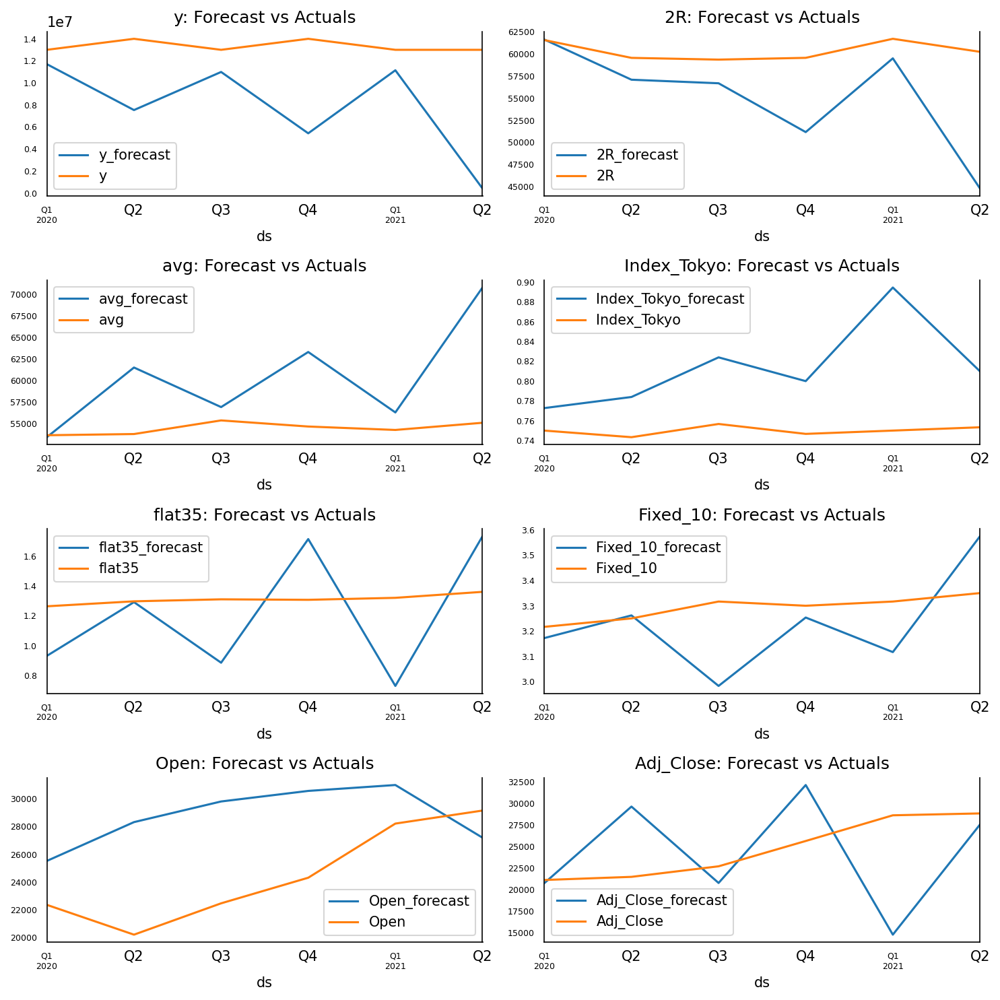

In [252]:
fig, axes = plt.subplots(nrows=int(len(test_2b.columns)/2), ncols=2, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(test_2b.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    test_2b[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)


plt.tight_layout();

In [253]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: y')
accuracy_prod = forecast_accuracy(df_results['y_forecast'].values, test_2b['y'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: 2R')
accuracy_prod = forecast_accuracy(df_results['2R_forecast'].values, test_2b['2R'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: avg')
accuracy_prod = forecast_accuracy(df_results['avg_forecast'].values, test_2b['avg'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Index_Tokyo')
accuracy_prod = forecast_accuracy(df_results['Index_Tokyo_forecast'].values, test_2b['Index_Tokyo'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))
    
    
# print('\nForecast Accuracy of: long_term_prime_rate')
# accuracy_prod = forecast_accuracy(df_results['long_term_prime_rate_forecast'].values, test_2b['long_term_prime_rate'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: flat_35')
accuracy_prod = forecast_accuracy(df_results['flat35_forecast'].values, test_2b['flat35'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))


# print('\nForecast Accuracy of: Fixed_3')
# accuracy_prod = forecast_accuracy(df_results['Fixed_3_forecast'].values, test_2b['Fixed_3'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: Fixed_2')
# accuracy_prod = forecast_accuracy(df_results['Fixed_2_forecast'].values, test_2b['Fixed_2'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Fixed_10')
accuracy_prod = forecast_accuracy(df_results['Fixed_10_forecast'].values, test_2b['Fixed_10'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))
    
print('\nForecast Accuracy of: Open')
accuracy_prod = forecast_accuracy(df_results['Open_forecast'].values, test_2b['Open'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Adj_Close')
accuracy_prod = forecast_accuracy(df_results['Adj_Close_forecast'].values, test_2b['Adj_Close'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))


Forecast Accuracy of: y
mape   :  0.4068
me     :  -5467039.4921
mae    :  5467039.4921
mpe    :  -0.4068
rmse   :  6867842.1468
corr   :  -0.2448
minmax :  0.4068

Forecast Accuracy of: 2R
mape   :  0.087
me     :  -5200.4525
mae    :  5220.9787
mpe    :  -0.0866
rmse   :  7401.0574
corr   :  0.4612
minmax :  0.087

Forecast Accuracy of: avg
mape   :  0.1092
me     :  5896.6153
mae    :  5971.9441
mpe    :  0.1078
rmse   :  8025.505
corr   :  0.4486
minmax :  0.0918

Forecast Accuracy of: Index_Tokyo
mape   :  0.0854
me     :  0.0641
mae    :  0.0641
mpe    :  0.0854
rmse   :  0.0748
corr   :  0.2935
minmax :  0.0767

Forecast Accuracy of: flat_35
mape   :  0.2703
me     :  -0.0954
mae    :  0.3548
mpe    :  -0.0754
rmse   :  0.396
corr   :  0.4606
minmax :  0.2482

Forecast Accuracy of: Fixed_10
mape   :  0.0432
me     :  -0.0646
mae    :  0.1434
mpe    :  -0.0197
rmse   :  0.1851
corr   :  0.2928
minmax :  0.0425

Forecast Accuracy of: Open
mape   :  0.2159
me     :  4290.0113
mae  

# Time Series Forecasting with PyCaret Regression Module

In [254]:
# combined2b
def data_prep(source):

    data = source.reset_index()

    # extract month and year from dates
    data['Quarter'] = [i.quarter for i in data['ds']]

    data['Year'] = [i.year for i in data['ds']]

    # create a sequence of numbers
    data['Series'] = np.arange(1,len(data)+1)

    # drop unnecessary columns and re-arrange
    data.drop(['ds'], axis=1, inplace=True)
    data = data[['Series', 'Year', 'Quarter', 'y']] 
    # check the head of the dataset
    data.head(16)
    return data

In [255]:
data2b = data_prep (combined2b)

In [305]:
# split data into train-test set
train2b = data2b[data2b['Year'] < 2021]
test2b = data2b[data2b['Year'] >= 2021]
# check shape
train2b.shape, test2b.shape


((32, 4), (2, 4))

In [306]:
train2b

,Series,Year,Quarter,y
0,1,2013,1,13000000.0
1,2,2013,2,13000000.0
2,3,2013,3,13000000.0
3,4,2013,4,13000000.0
4,5,2014,1,14000000.0
5,6,2014,2,12500000.0
6,7,2014,3,13000000.0
7,8,2014,4,13000000.0
8,9,2015,1,14000000.0
9,10,2015,2,13000000.0


In [307]:
# initialize setup

s = setup(data = train2b, test_data = test2b, target = 'y', fold_strategy = 'timeseries',  fold = 8, transform_target = False, session_id = 168)
# s = setup(data = train2b, test_data = test2b, target = 'y', fold_strategy = 'timeseries',  fold = 9, transform_target = True, transformation_method = 'quantile', session_id = 168)

,Description,Value
0,session_id,168
1,Target,y
2,Original Data,"(32, 4)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(32, 12)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Series'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='y',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

In [308]:
best2b = compare_models(sort = 'RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dt,Decision Tree Regressor,208333.3333,208333333333.3333,318568.4236,0.1250,0.0236,0.0151,0.0112
huber,Huber Regressor,209219.0193,208311415710.1542,319894.9137,-0.4374,0.0237,0.0149,0.0325
lightgbm,Light Gradient Boosting Machine,263475.2894,178994481026.1776,342720.1836,-0.2810,0.0255,0.0192,0.0138
br,Bayesian Ridge,263475.2894,178994481026.2880,342720.1836,-0.2810,0.0255,0.0192,0.0112
en,Elastic Net,256588.3357,178682204376.0000,347752.5242,-0.2593,0.0258,0.0187,0.0188
rf,Random Forest Regressor,263333.3333,201154166666.6667,376036.3176,-0.2978,0.0280,0.0192,0.2300
gbr,Gradient Boosting Regressor,259771.0181,231620937027.1381,385113.7262,-0.3327,0.0286,0.0189,0.0213
et,Extra Trees Regressor,257083.3333,228604166666.6666,389731.4080,-0.0480,0.0289,0.0188,0.2000
omp,Orthogonal Matching Pursuit,308304.1973,216294404431.6698,405872.6930,-0.3093,0.0302,0.0227,0.0300
knn,K Neighbors Regressor,324999.9966,246666671648.0000,427738.3765,-0.5069,0.0319,0.0239,0.0350


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=168, splitter='best')
INFO:logs:compare_models() succesfully completed......................................
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/tree/_classes.py:1254: FutureWarning: the classes_ attribute is to be deprecated from version 0.22 and will be removed in 0.24.
  warnings.warn(msg, FutureWarning)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/tree/_classes.py:1262: FutureWarning: the n_classes_ attribute is to be deprecated from 

/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/tree/_classes.py:1254: FutureWarning: the classes_ attribute is to be deprecated from version 0.22 and will be removed in 0.24.
  warnings.warn(msg, FutureWarning)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/tree/_classes.py:1262: FutureWarning: the n_classes_ attribute is to be deprecated from version 0.22 and will be removed in 0.24.
  warnings.warn(msg, FutureWarning)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 737416314880.0, tolerance: 3224000000.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_least_angle.py:604: ConvergenceWarning: Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 

/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_least_angle.py:578: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=2.312e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  ConvergenceWarning)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_least_angle.py:578: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=5.936e-04, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  ConvergenceWarning)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_stochastic_gradient.py:1211: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to im

The best model based on cross-validated RMSE is Huber Regressor (RMSE: 159260.8916). Let’s check the score on the test set.

In [260]:
prediction_holdout = predict_model(best2b);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,333333.3333,333333333333.3333,577350.2692,-0.5000,0.0428,0.0238


In [261]:
perc = (577350.2688 - 159260.8916)/159260.8916
print(perc)

2.6251854614130514


RMSE on the test set is 263% higher than the cross-validated RMSE. Not so good, but we will work with it. Let's plot the actual and predicted lines to visualize the fit.

In [262]:
# generate predictions on the original dataset
pred_2b = predict_model(best2b, data=data2b)

# add a date column in the dataset
pred_2b['ds'] = pd.date_range('2013-01-01', periods=34, freq='Q-DEC').to_period().asfreq('D', 's')

pred_2b['Date'] = pred_2b['ds'].astype(str)
pred_2b.info()

# line plot
pred_2b = pred_2b.rename({'Label':'y_pred'}, axis=1)
fig = px.line(pred_2b, x='Date', y=["y", "y_pred"], template = 'plotly_dark')

# add a vertical rectange for test-set separation
fig.add_vrect(x0="2020-01-01", x1="2021-04-01", fillcolor="grey", opacity=0.39, line_width=0)
fig.show()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype    
---  ------   --------------  -----    
 0   Series   34 non-null     int64    
 1   Year     34 non-null     int64    
 2   Quarter  34 non-null     int64    
 3   y        34 non-null     float64  
 4   Label    34 non-null     float64  
 5   ds       34 non-null     period[D]
 6   Date     34 non-null     object   
dtypes: float64(2), int64(3), object(1), period[D](1)
memory usage: 2.0+ KB


In [263]:
final_best2b = finalize_model(best2b)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168), fit_kwargs=None, groups=None, model_only=True, display=None)
INFO:logs:Finalizing AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168)
INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168), fold=None, round=4, cross_validation=True, predict=True, fit_kwargs={}, groups=None, refit=True, verbose=False, system=False, metrics=None, add_to_model_list=False, display=None, kwargs={})
INFO:logs:Checking exceptions
INFO:logs:Importing libraries
INFO:logs:Copying training dataset
INFO:logs:Defining folds
INFO:logs:Declaring metric variables
INFO:logs:Importing untrained model
INFO:logs

In [264]:
future_dates = pd.date_range('2021-07-01', periods=2, freq='Q-DEC').to_period().asfreq('D', 's')
future_df = pd.DataFrame()
future_df['Quarter'] = [i.quarter for i in future_dates]
future_df['Year'] = [i.year for i in future_dates]    
# start the series at 101
future_df['Series'] = np.arange(101,(101+len(future_dates)))
future_df.head()


,Quarter,Year,Series
0,3,2021,101
1,4,2021,102


In [265]:
# future_2b

In [266]:
# future_2b = future_2b[['1R', '2R', '3R', 'avg', 'Index_Tokyo', 'Old_rate', 'flat35', 'long_term_prime_rate', 
#                        '10-<15', '15-<20', '20-<35', 'Variable', 'Fixed_2', 'Fixed_3', 'Fixed_5', 'Fixed_10',
#                        'Housing_Starts', 'Open', 'High', 'Low', 'Adj_Close']]
# future_2b['Series'] = 101
# future_df = future_df.merge(future_2b, on = 'Series', how = 'left')
# future_df

In [267]:
predictions_future = predict_model(final_best2b, data=future_df)
predictions_future.tail()
predictions_future = predictions_future.rename({'Label':'y_pred'}, axis=1)
predictions_future.info()
# predictions_future
concat_df = pd.concat([pred_2b[['Quarter', 'Year',  'Series', 'y']],predictions_future], axis=0)
concat_df_i = pd.date_range('2013-01-01', periods=36, freq='Q-DEC').to_period().asfreq('D', 's')
concat_df['Date'] = concat_df_i.astype(str)
concat_df.set_index(concat_df['Date'], inplace=True)
# predictions_future_m = predictions_future.merge(pred_2a[['y', 'Series']], on = 'Series', how = 'left').set_index('Date')

fig = px.line(concat_df, x=concat_df.index, y=["y_pred","y"], template = 'plotly_dark')
fig.show()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=168), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Quarter  2 non-null      int64  
 1   Year     2 non-null      int64  
 2   Series   2 non-null      int64  
 3   y_pred   2 non-null      float64
dtypes: float64(1), int64(3)
memory usage: 192.0 bytes


# Start of combined2c

In [331]:
# train, test = train_test_split(combined2c, '20Q1')
train, test = train_test_split(combined2c)
train.tail()

Train's dimension is: (32, 22)
Test's dimension is: (2, 22)


,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,...,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,
2019-10-01,25000000.0,47139.666667,59921.000000,67389.333333,54545.666667,0.753333,1.116667,1.163333,0.950000,1.546667,...,2.475,2.616667,2.800000,2.866667,3.216667,3284.666667,22650.186849,23569.203125,22342.129557,23292.522787
2020-01-01,25000000.0,46221.000000,61584.000000,69777.666667,53662.000000,0.750000,1.225000,1.263333,0.950000,1.606667,...,2.475,2.700000,2.900000,3.000000,3.216667,2909.000000,22347.939453,23277.032552,20055.846680,21088.383464
2020-04-01,24000000.0,46673.333333,59568.333333,68483.666667,53801.333333,0.743333,NaN,1.296667,1.066667,1.730000,...,2.475,2.783333,2.983333,3.083333,3.250000,2843.333333,20196.326823,21835.726562,19541.753255,21453.240234
2020-07-01,24000000.0,51463.333333,59370.333333,67706.333333,55380.000000,0.756667,NaN,1.310000,1.083333,1.780000,...,2.475,2.800000,3.000000,3.116667,3.316667,2626.333333,22458.503906,23339.779948,22169.513672,22678.292969
2020-10-01,25000000.0,45744.000000,59571.666667,68319.666667,54672.666667,0.746667,NaN,1.306667,1.100000,1.780000,...,2.475,2.816667,3.016667,3.183333,3.300000,3109.333333,24306.623047,26054.099609,24124.113281,25618.306641


In [332]:
test

,y,1R,2R,3R,avg,Index_Tokyo,Old_rate,flat35,long_term_prime_rate,10-<15,...,Variable,Fixed_2,Fixed_3,Fixed_5,Fixed_10,Housing_Starts,Open,High,Low,Adj_Close
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01,25000000.0,46952.333333,61728.333333,70415.666667,54275.333333,0.750000,NaN,1.32,1.1,1.846667,...,2.475,2.8,3.0,3.216667,3.316667,2939.333333,28214.696615,30059.682943,27653.273438,28602.733724
2021-04-01,24000000.0,47750.000000,60255.000000,68576.333333,55107.000000,0.753333,NaN,1.36,1.0,1.840000,...,2.475,2.8,3.0,3.250000,3.350000,3226.333333,29154.856771,29791.716797,27866.909505,28821.413411


In [333]:

# Name   ::  Test Stat > C(95%)    =>   Signif  
#  ----------------------------------------
# y      ::  nan       > nan       =>   False
# 1R     ::  nan       > nan       =>   False
# 2R     ::  2398.92   > nan       =>   False
# 3R     ::  1747.08   > nan       =>   False
# avg    ::  1148.9    > 311.1288  =>   True
# Index_Tokyo ::  580.2     > 263.2603  =>   True
# flat35 ::  412.66    > 219.4051  =>   True
# long_term_prime_rate ::  280.68    > 179.5199  =>   True
# 10-<15 ::  204.19    > 143.6691  =>   True
# 15-<20 ::  137.18    > 111.7797  =>   True
# 20-<35 ::  91.28     > 83.9383   =>   True
# Fixed_2 ::  52.34     > 60.0627   =>   False
# Fixed_3 ::  28.78     > 40.1749   =>   False
# Housing_Starts ::  9.28      > 24.2761   =>   False
# Low    ::  2.94      > 12.3212   =>   False
# Adj_Close ::  0.81      > 4.1296    =>   False

# Removed additionally, Fixed_3 and Adj_Close to make sure matrix is positive definite
# Removed 1R to make all the time series stationary after 2 differencing
# Removed long_term_prime_rate to prevent getting error of array is not positive definite
# Removed '15-<20', '20-<35', 'Housing_Starts', 'Open','Low', 'Adj_Close'

# horizon = 2
# Removed 'Fixed_2', 'Fixed_5', 'High', 'Adj_Close'

df_train = train[[ 'y', '1R', '2R','3R', 'avg', 'Index_Tokyo', 'flat35', 'long_term_prime_rate', '10-<15', 
                  '15-<20', '20-<35', 'Fixed_10',  'Housing_Starts', 'Low'
                 ]]


In [334]:
# ADF Test on each column
for name, column in df_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.274
 No. Lags Chosen       = 2
 Critical value 1%     = -3.679
 Critical value 5%     = -2.968
 Critical value 10%    = -2.623
 => P-Value = 0.641. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "1R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.3255
 No. Lags Chosen       = 8
 Critical value 1%     = -3.753
 Critical value 5%     = -2.998
 Critical value 10%    = -2.639
 => P-Value = 0.9967. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-St

The ADF test confirms not all of the time series is stationary. Let’s difference all of them once and check again.

In [335]:
# 1st difference
df_differenced = df_train.diff().dropna()# 1st difference


Re-run ADF test on each differenced series.

In [336]:
# ADF Test on each column of 1st Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.6847
 No. Lags Chosen       = 1
 Critical value 1%     = -3.679
 Critical value 5%     = -2.968
 Critical value 10%    = -2.623
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.8252
 No. Lags Chosen       = 7
 Critical value 1%     = -3.753
 Critical value 5%     = -2.998
 Critical value 10%    = -2.639
 => P-Value = 0.0027. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Tes

<!-- Not all time series is stationary. Prompting me to difference all of them once more and check again. -->

In [337]:
# Second Differencing
df_differenced = df_differenced.diff().dropna()

In [338]:
# ADF Test on each column of 2nd Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -8.3257
 No. Lags Chosen       = 3
 Critical value 1%     = -3.711
 Critical value 5%     = -2.981
 Critical value 10%    = -2.63
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.0537
 No. Lags Chosen       = 7
 Critical value 1%     = -3.77
 Critical value 5%     = -3.005
 Critical value 10%    = -2.643
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2R" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Sta

In [329]:
#  Have to remove 1R to make all the time series stationary.
# don't have to do the above for horizon = 2

All rows are now stationary.

To select the right order of the VAR model, we iteratively fit increasing orders of VAR model and pick the order that gives a model with least AIC.

In [339]:
model = VAR(df_differenced)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe, '\n')
#     print('HQIC: ', result.hqic, )

Lag Order = 1
AIC :  48.75010463485572
FPE :  6.993011697979986e+21 

Lag Order = 2
AIC :  -605.0087713281204
FPE :  1.720826610824605e-251 

Lag Order = 3
AIC :  -628.0283683471548
FPE :  7.21308507332213e-284 

Lag Order = 4
AIC :  -732.3766851370458
FPE :  0.0 

Lag Order = 5
AIC :  -722.7652376939143
FPE :  0.0 

Lag Order = 6
AIC :  -702.2374323892313
FPE :  0.0 

Lag Order = 7
AIC :  -692.6813439841785
FPE :  0.0 

Lag Order = 8
AIC :  -668.5116609374384
FPE :  0.0 

Lag Order = 9
AIC :  -642.9128291626839
FPE :  0.0 

Lag Order = 10
AIC :  -619.8217991788462
FPE :  0.0 

Lag Order = 11
AIC :  -595.845412831867
FPE :  0.0 

Lag Order = 12
AIC :  -564.3879566906985
FPE :  0.0 

Lag Order = 13
AIC :  -536.7144953840639
FPE :  0.0 

Lag Order = 14
AIC :  -516.0028678231512
FPE :  0.0 



In the above output, the AIC drops to lowest at lag 4, then increases at lag 5 and then increases back to -516 level

Let’s go with the lag 4 model.

In [278]:
model_fitted = model.fit(4)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:36:59
--------------------------------------------------------------------
No. of Equations:         14.0000    BIC:                   -693.763
Nobs:                     26.0000    HQIC:                  -721.257
Log likelihood:           9802.40    FPE:                    0.00000
AIC:                     -732.377    Det(Omega_mle):         0.00000
--------------------------------------------------------------------
Results for equation y
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                          34.569352              NAN              NAN             NAN
L1.y                           -0.869633              NAN              NAN             NAN
L1.1R                   

## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic


In [279]:
def adjust(val, length= 6): return str(val).ljust(length)
out = durbin_watson(model_fitted.resid)


for col, val in zip(df_train.columns, out):
    print(adjust(col), ':', round(val, 2))

y      : 2.72
1R     : 2.26
2R     : 1.74
3R     : 1.54
avg    : 1.69
Index_Tokyo : 2.09
flat35 : 3.01
long_term_prime_rate : 2.5
10-<15 : 2.2
15-<20 : 3.07
20-<35 : 1.82
Fixed_10 : 2.39
Housing_Starts : 1.73
Low    : 2.26


Since we would like Durbin Watson (DW) statistic to be close to 2, we decided to remove the columns of flat35, 15-<20 where the deviation from 2 is more than 1. The interpretation is with the remaining ones, there is no significant serial correlation with the residuals. In other words, there isn't any leftover pattern in the residuals (errors).

In [280]:
# df_train2c = train[['y', '1R', '2R', 'avg', 'Index_Tokyo', 'Low']]
df_train2c = train[['y', '1R', '2R', '3R', 'avg', 'Index_Tokyo', 'long_term_prime_rate', '10-<15', '15-<20', 
                    '20-<35', 'Fixed_10', 'Housing_Starts', 'Low'
                   ]]

df_differenced1 = df_differenced[['y', '2R', 'Fixed_10', 'Housing_Starts', 'Low'
                                ]]
df_differenced1.shape

(30, 5)

In [281]:
model = VAR(df_differenced1)
# model = VARMAX(df_differenced1)
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
#     print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
#     print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  64.9474231059606
FPE :  1.6575559740726573e+28
Lag Order = 2
AIC :  65.01972457823867
FPE :  2.160872458683476e+28
Lag Order = 3
AIC :  61.4970566662192
FPE :  1.2434097993696364e+27
Lag Order = 4
AIC :  50.621447941787935
FPE :  2.2003494141829656e+23
Lag Order = 5
AIC :  -141.73148296923662
FPE :  -2.9375637696147025e-58
Lag Order = 6
AIC :  -202.90355237533439
FPE :  -5.582041157547975e-90
Lag Order = 7
AIC :  -218.39223817460365
FPE :  -4.368643508579488e-99
Lag Order = 8
AIC :  -216.24820609802256
FPE :  -3.925203908691134e-100
Lag Order = 9
AIC :  -219.2217952836431
FPE :  -2.634758066994051e-103
Lag Order = 10
AIC :  -216.929397360042
FPE :  -3.263876743953155e-104
Lag Order = 11
AIC :  -216.15744373721316
FPE :  -7.211975542337415e-106
Lag Order = 12
AIC :  -214.21090968022787
FPE :  -3.736110380804735e-107
Lag Order = 13
AIC :  -211.794348964285
FPE :  -2.0065427489624693e-108
Lag Order = 14
AIC :  -209.89603581640924
FPE :  -3.6921135802410593e-110
Lag Or

### Re-do the model fitting with lag 15

In [282]:
model_fitted = model.fit(maxlags = 15)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 05, Dec, 2021
Time:                     08:36:59
---------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    -206.842
Nobs:                     15.0000    HQIC:                   -224.970
Log likelihood:           1959.42    FPE:               -1.75409e-119
AIC:                     -224.779    Det(Omega_mle):    -2.13453e-123
---------------------------------------------------------------------
Results for equation y
                        coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------
const                      0.000007         0.000589            0.011           0.991
L1.y                      -0.579898         0.000000   -194445308.426           0.000
L1.2R                      0.001404   

In [283]:
# Get the lag order
lag_order = model_fitted.k_ar
print(lag_order)

# Input data for forecasting
forecast_input = df_differenced1.values[-lag_order:]
forecast_input

15


array([[ 2.00000000e+06, -2.30533333e+03,  2.33333333e-01,
         4.78666667e+02, -1.59339030e+03],
       [-2.00000000e+06,  1.28966667e+03, -2.00000000e-01,
        -2.55000000e+02,  2.09953775e+02],
       [ 1.00000000e+06, -1.17633333e+03, -5.00000000e-02,
         4.08666667e+02,  1.58602344e+03],
       [ 1.00000000e+06,  3.17000000e+03,  5.00000000e-02,
        -9.32000000e+02, -2.05687695e+03],
       [-2.00000000e+06, -3.61766667e+03,  0.00000000e+00,
         1.28033333e+03,  2.51740235e+02],
       [ 2.00000000e+06,  1.59700000e+03,  1.66666667e-02,
        -1.19666667e+03, -6.73769530e+01],
       [-1.00000000e+06, -6.00666667e+02, -4.44089210e-16,
         9.62666667e+02, -1.59479297e+03],
       [ 0.00000000e+00,  2.93200000e+03, -1.66666667e-01,
        -5.22666667e+02,  1.20921289e+03],
       [ 0.00000000e+00, -3.58433333e+03,  1.16666667e-01,
        -2.02000000e+02,  8.56576822e+02],
       [-1.00000000e+06,  3.71666667e+02, -1.00000000e-01,
         6.05000000e+02

Like train, we need to subset the test dataframe to just the columns

In [284]:
test_2c = test[['y', '2R', 'Fixed_10', 'Housing_Starts', 'Low']]
test_2c.shape

(2, 5)

In [285]:
nobs = 2
# Forecast
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
# df_forecast = pd.DataFrame(fc, index=df_differenced.index[-nobs:], columns=df_differenced.columns + '_2d')
df_forecast = pd.DataFrame(fc, index=test_2c.index, columns=test_2c.columns + '_2d')
df_forecast

,y_2d,2R_2d,Fixed_10_2d,Housing_Starts_2d,Low_2d
ds,,,,,
2021-01-01,1.616923e+06,5511.291522,0.049558,-1053.797017,-4405.162001
2021-04-01,-5.789284e+06,-6187.144425,-0.002052,-389.053981,-1422.187579


#### Invert the transformation by de-differencing the data 2 times

In [286]:
df_results = invert_transformation(test_2c, df_forecast, second_diff=True)        
df_results.loc[:, ['y_forecast', '2R_forecast', 'Fixed_10_forecast', 'Housing_Starts_forecast', 'Low_forecast']]

,y_forecast,2R_forecast,Fixed_10_forecast,Housing_Starts_forecast,Low_forecast
ds,,,,,
2021-01-01,2.461692e+07,64292.958189,3.432891,2459.536316,23675.383571
2021-04-01,1.944456e+07,62143.771954,3.513730,1303.685318,18061.670058


#### The forecasts are back to the original scale. Let’s plot the forecasts against the actuals from test data.

## Plot of Forecast vs Actuals

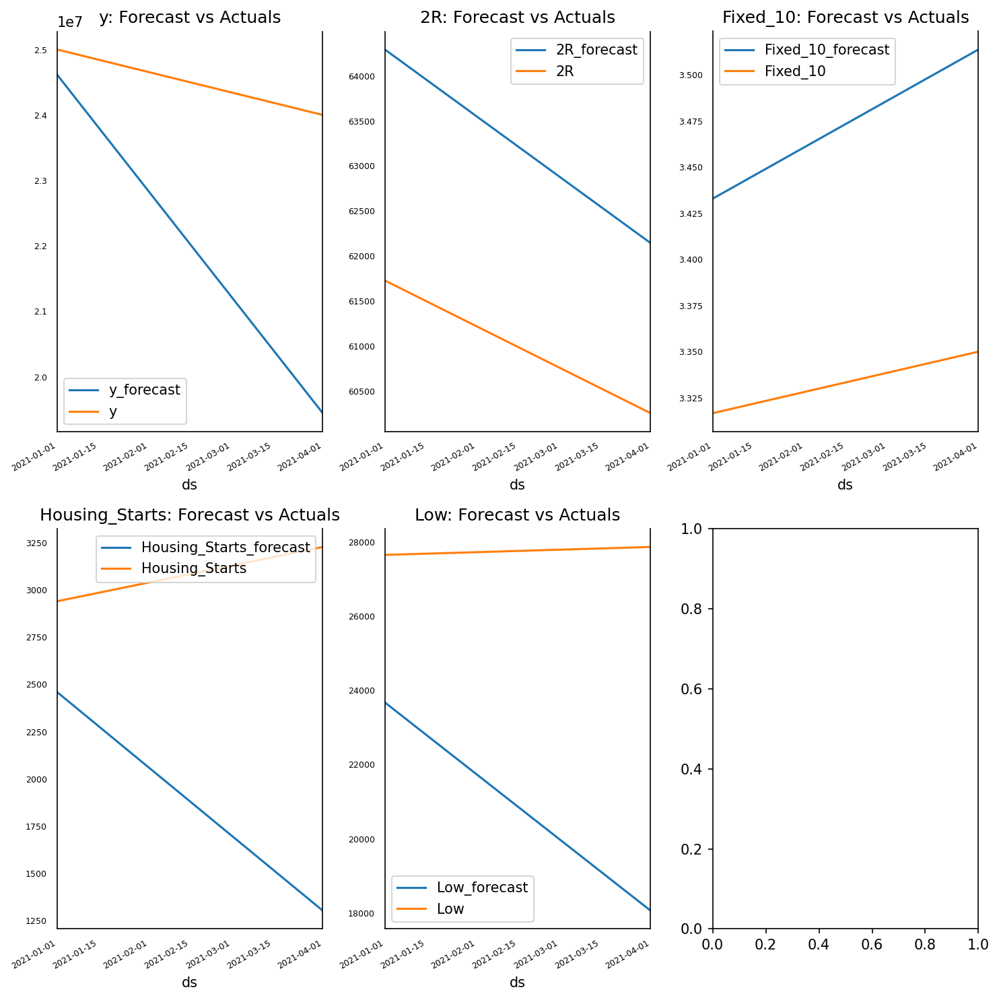

In [287]:
fig, axes = plt.subplots(nrows=int(len(test_2c.columns)/2), ncols=3, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(test_2c.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    test_2c[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [288]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: y')
accuracy_prod = forecast_accuracy(df_results['y_forecast'].values, test_2c['y'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: 2R')
accuracy_prod = forecast_accuracy(df_results['2R_forecast'].values, test_2c['2R'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: avg')
# accuracy_prod = forecast_accuracy(df_results['avg_forecast'].values, test_2c['avg'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: Index_Tokyo')
# accuracy_prod = forecast_accuracy(df_results['Index_Tokyo_forecast'].values, test_2c['Index_Tokyo'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Housing_Starts')
accuracy_prod = forecast_accuracy(df_results['Housing_Starts_forecast'].values, test_2c['Housing_Starts'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

# print('\nForecast Accuracy of: Fixed_2')
# accuracy_prod = forecast_accuracy(df_results['Fixed_2_forecast'].values, test_2c['Fixed_2'])
# for k, v in accuracy_prod.items():
#     print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: Fixed_10')
accuracy_prod = forecast_accuracy(df_results['Fixed_10_forecast'].values, test_2c['Fixed_10'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))
    
print('\nForecast Accuracy of: Low')
accuracy_prod = forecast_accuracy(df_results['Low_forecast'].values, test_2c['Low'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

Forecast Accuracy of: y
mape   :  0.1026
me     :  -2469257.6663
mae    :  2469257.6663
mpe    :  -0.1026
rmse   :  3232550.3976
corr   :  1.0
minmax :  0.1026

Forecast Accuracy of: 2R
mape   :  0.0364
me     :  2226.6984
mae    :  2226.6984
mpe    :  0.0364
rmse   :  2252.1945
corr   :  1.0
minmax :  0.0351

Forecast Accuracy of: Housing_Starts
mape   :  0.3796
me     :  -1201.2225
mae    :  1201.2225
mpe    :  -0.3796
rmse   :  1401.2103
corr   :  -1.0
minmax :  0.3796

Forecast Accuracy of: Fixed_10
mape   :  0.042
me     :  0.14
mae    :  0.14
mpe    :  0.042
rmse   :  0.142
corr   :  1.0
minmax :  0.0402

Forecast Accuracy of: Low
mape   :  0.2479
me     :  -6891.5647
mae    :  6891.5647
mpe    :  -0.2479
rmse   :  7482.1898
corr   :  -1.0
minmax :  0.2479


# Time Series Forecasting with PyCaret Regression Module

In [289]:
# combined2c
def data_prep(source):

    data = source.reset_index()

    # extract month and year from dates
    data['Quarter'] = [i.quarter for i in data['ds']]

    data['Year'] = [i.year for i in data['ds']]

    # create a sequence of numbers
    data['Series'] = np.arange(1,len(data)+1)

    # drop unnecessary columns and re-arrange
    data.drop(['ds'], axis=1, inplace=True)
    data = data[['Series', 'Year', 'Quarter', 'y']] 
    # check the head of the dataset
    data.head(16)
    return data

In [290]:
data2c = data_prep (combined2c)

In [315]:
# split data into train-test set
train2c = data2c[data2c['Year'] < 2020]
test2c = data2c[data2c['Year'] >= 2020]
# check shape
train2c.shape, test2c.shape


((28, 4), (6, 4))

In [316]:
# initialize setup

s = setup(data = train2c, test_data = test2c, target = 'y', fold_strategy = 'timeseries',  fold = 8, transform_target = False, session_id = 168)


,Description,Value
0,session_id,168
1,Target,y
2,Original Data,"(28, 4)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(28, 11)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Series'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='y',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

In [314]:
best2c = compare_models(sort = 'RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lasso,Lasso Regression,876424.0859,1239022887936.0000,1003618.8711,-3.8340,0.0424,0.0363,0.0100
ridge,Ridge Regression,987174.0039,1404807012352.0000,1083737.2930,-4.2584,0.0457,0.0405,0.0138
ada,AdaBoost Regressor,965389.6281,1591809235835.7651,1123161.0993,-5.2331,0.0475,0.0396,0.0512
huber,Huber Regressor,1084158.7206,1553715654449.7690,1145834.2622,-4.6408,0.0480,0.0443,0.0213
rf,Random Forest Regressor,1046250.0000,1620454166666.6665,1149151.8010,-5.0552,0.0486,0.0429,0.2362
en,Elastic Net,1080392.0820,1568487077888.0000,1160181.5117,-4.8066,0.0487,0.0441,0.0213
lightgbm,Light Gradient Boosting Machine,1126548.1419,1640779827904.1724,1183546.6262,-4.9818,0.0497,0.0460,0.0488
br,Bayesian Ridge,1126548.1419,1640779827903.2446,1183546.6262,-4.9818,0.0497,0.0460,0.0125
gbr,Gradient Boosting Regressor,1047775.1282,1753687928226.3159,1212401.6111,-5.6016,0.0513,0.0431,0.0200
llar,Lasso Least Angle Regression,1111681.3967,1926919221066.7483,1255015.1787,-5.5658,0.0532,0.0458,0.0138


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:compare_models() succesfully completed......................................
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51716161536.0, tolerance: 672727232.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 807581253632.0, tolerance: 2721739264.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/pyt

/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 582652788736.0, tolerance: 1494117632.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 818315526144.0, tolerance: 3446153728.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1875307392.0, tolerance: 600000000.0
  positive)
/Users/dpong/opt/anaconda3/envs/stan/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. Y

The best model based on cross-validated RMSE is Lasso Regression (RMSE: 1052455.0625). Let’s check the score on the test set.

In [294]:
prediction_holdout = predict_model(best2c);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Lasso Regression,2214270.0000,5249929052160.0000,2291272.2500,-19.9997,0.0977,0.0899


In [295]:
perc = (2291272.2500 - 1052455.0625)/1052455.0625
print(perc)


1.1770737123514954


RMSE on the test set is 117.7% higher than the cross-validated RMSE. Not so good, but we will work with it. Let's plot the actual and predicted lines to visualize the fit.


In [296]:
# generate predictions on the original dataset
pred_2c = predict_model(best2c, data=data2c)

# add a date column in the dataset
pred_2c['ds'] = pd.date_range('2013-01-01', periods=34, freq='Q-DEC').to_period().asfreq('D', 's')

pred_2c['Date'] = pred_2c['ds'].astype(str)
pred_2c.info()

# line plot
pred_2c = pred_2c.rename({'Label':'y_pred'}, axis=1)
fig = px.line(pred_2c, x='Date', y=["y", "y_pred"], template = 'plotly_dark')

# add a vertical rectange for test-set separation
fig.add_vrect(x0="2020-01-01", x1="2021-04-01", fillcolor="grey", opacity=0.39, line_width=0)
fig.show()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype    
---  ------   --------------  -----    
 0   Series   34 non-null     int64    
 1   Year     34 non-null     int64    
 2   Quarter  34 non-null     int64    
 3   y        34 non-null     float64  
 4   Label    34 non-null     float32  
 5   ds       34 non-null     period[D]
 6   Date     34 non-null     object   
dtypes: float32(1), float64(1), int64(3), object(1), period[D](1)
memory usage: 1.9+ KB


In [297]:
# final_best2a = finalize_model(best2a)
# future_dates = pd.date_range('2021-07-01', periods=2, freq='Q-DEC').to_period().asfreq('D', 's')
# future_df = pd.DataFrame()
# future_df['Quarter'] = [i.quarter for i in future_dates]
# future_df['Year'] = [i.year for i in future_dates]    
# # start the series at 101
# future_df['Series'] = np.arange(101,(101+len(future_dates)))
# future_df.head()
# # future_2a = future_2a[['1R', '2R', '3R', 'avg', 'Index_Tokyo', 'Old_rate', 'flat35', 'long_term_prime_rate', '10-<15', '15-<20', '20-<35', 'Variable', 'Fixed_2', 'Fixed_3', 'Fixed_5', 'Fixed_10', 'Housing_Starts', 'Open', 'High', 'Low', 'Adj_Close']]
# # future_2a['Series'] = 101
# # future_df = future_df.merge(future_2a, on = 'Series', how = 'left')
# # future_df
# predictions_future = predict_model(final_best2a, data=future_df)
# predictions_future.tail()
# predictions_future = predictions_future.rename({'Label':'y_pred'}, axis=1)
# predictions_future.info()
# # predictions_future
# concat_df = pd.concat([pred_2a[['Quarter', 'Year',  'Series', 'y']],predictions_future], axis=0)
# concat_df_i = pd.date_range('2013-01-01', periods=36, freq='Q-DEC').to_period().asfreq('D', 's')
# concat_df['Date'] = concat_df_i.astype(str)
# concat_df.set_index(concat_df['Date'], inplace=True)
# # predictions_future_m = predictions_future.merge(pred_2a[['y', 'Series']], on = 'Series', how = 'left').set_index('Date')

# fig = px.line(concat_df, x=concat_df.index, y=["y_pred","y"], template = 'plotly_dark')
# fig.show()

In [298]:
final_best2c = finalize_model(best2c)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), fit_kwargs=None, groups=None, model_only=True, display=None)
INFO:logs:Finalizing Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), fold=None, round=4, cross_validation=True, predict=True, fit_kwargs={}, groups=None, refit=True, verbose=False, system=False, metrics=None, add_to_model_list=False, display=None, kwa

In [299]:
future_dates = pd.date_range('2021-07-01', periods=2, freq='Q-DEC').to_period().asfreq('D', 's')
future_df = pd.DataFrame()
future_df['Quarter'] = [i.quarter for i in future_dates]
future_df['Year'] = [i.year for i in future_dates]    
# start the series at 101
future_df['Series'] = np.arange(101,(101+len(future_dates)))
future_df.head()


,Quarter,Year,Series
0,3,2021,101
1,4,2021,102


In [300]:
# future_2c = future_2c[['1R', '2R', '3R', 'avg', 'Index_Tokyo', 'Old_rate', 'flat35', 'long_term_prime_rate', '10-<15', '15-<20', '20-<35', 'Variable', 'Fixed_2', 'Fixed_3', 'Fixed_5', 'Fixed_10', 'Housing_Starts', 'Open', 'High', 'Low', 'Adj_Close']]
# future_2c['Series'] = 101
# future_df = future_df.merge(future_2c, on = 'Series', how = 'left')
# future_df


In [301]:
predictions_future = predict_model(final_best2c, data=future_df)
predictions_future.tail()
predictions_future = predictions_future.rename({'Label':'y_pred'}, axis=1)
predictions_future.info()
# predictions_future
concat_df = pd.concat([pred_2c[['Quarter', 'Year',  'Series', 'y']],predictions_future], axis=0)
concat_df_i = pd.date_range('2013-01-01', periods=36, freq='Q-DEC').to_period().asfreq('D', 's')
concat_df['Date'] = concat_df_i.astype(str)
concat_df.set_index(concat_df['Date'], inplace=True)
# predictions_future_m = predictions_future.merge(pred_2a[['y', 'Series']], on = 'Series', how = 'left').set_index('Date')

fig = px.line(concat_df, x=concat_df.index, y=["y_pred","y"], template = 'plotly_dark')
fig.show()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=168,
      selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Quarter  2 non-null      int64  
 1   Year     2 non-null      int64  
 2   Series   2 non-null      int64  
 3   y_pred   2 non-null      float32
dtypes: float32(1), int64(3)
memory usage: 184.0 bytes


### Model Comparison

In [302]:
# lower-tier
d1 = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['986,876.336', '2,419,416.2248', '0.1687', '0.3681'], 'Lasso Regression': ['333,591.1840' ,'312,126.0660', '0.0472' , '0.0465'], 'K Neighbors Regressor':['327,168.5599','321,741.2552' ,'0.0508' ,'0.0513']}
mc1 = pd.DataFrame(data=d1)
mc1
# mc1.style.apply(lambda x: ["background-color: #ff33aa" 
#                           if (i >= 3 and not v=='') else "" for i, v in enumerate(x)
#                           ], axis = 1
#                )




,metric,horizon,VAR,Lasso Regression,K Neighbors Regressor
0,RMSE,2,"986,876.336","333,591.1840","327,168.5599"
1,RMSE,6,"2,419,416.2248","312,126.0660","321,741.2552"
2,MAPE,2,0.1687,0.0472,0.0508
3,MAPE,6,0.3681,0.0465,0.0513


In [303]:
d1_float = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['986,876.336', '2,419,416.2248', '0.1687', '0.3681'], 'Lasso Regression': [333591.1840 ,312126.0660, 0.0472 , 0.0465], 'K Neighbors Regressor':[327168.5599,321741.2552 ,0.0508 ,0.0513]}
mc1 = pd.DataFrame(data=d1_float)

mc1.style.apply(lambda x: ["background-color: #ff33aa" 
                          if (i >= 3 and (v == x.iloc[3] if x.iloc[3] < x.iloc[4] else v == x.iloc[4])) else "" for i, v in enumerate(x)
                          ], axis = 1
               )

,metric,horizon,VAR,Lasso Regression,K Neighbors Regressor
0,RMSE,2,"986,876.336",333591.184000,327168.559900
1,RMSE,6,"2,419,416.2248",312126.066000,321741.255200
2,MAPE,2,0.1687,0.047200,0.050800
3,MAPE,6,0.3681,0.046500,0.051300


In [309]:
# mid-tier 
d2 = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['1,705,551.4859', '6,867,842.1468', '0.1247', '0.4068'], 'AdaBoost Regressor': ['467,846.7645' ,'297,193.5040', '0.0227' , '0.0138'], 'Decision Tree Regressor':['318,568.4236','369,362.2876' ,'0.0151' ,'0.0168'], 'Huber Regressor':['319,894.9137', '299,955.5974', '0.0149', '0.0138']}
mc2 = pd.DataFrame(data=d2)
mc2

,metric,horizon,VAR,AdaBoost Regressor,Decision Tree Regressor,Huber Regressor
0,RMSE,2,"1,705,551.4859","467,846.7645","318,568.4236","319,894.9137"
1,RMSE,6,"6,867,842.1468","297,193.5040","369,362.2876","299,955.5974"
2,MAPE,2,0.1247,0.0227,0.0151,0.0149
3,MAPE,6,0.4068,0.0138,0.0168,0.0138


In [311]:
d2_float = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['1,705,551.4859', '6,867,842.1468', '0.1247', '0.4068'], 'AdaBoost Regressor': [467846.7645 ,297193.5040, 0.0227 , 0.0138], 'Decision Tree Regressor':[318568.4236,369362.2876 ,0.0151 ,0.0168], 'Huber Regressor':[319894.9137, 299955.5974, 0.0149, 0.0138]}
mc2 = pd.DataFrame(data=d2_float)


# note that iloc slicing requires it to be 6 instead of 5.
mc2.style.apply(lambda x: ["background-color: #ff33aa" 
                          if (i >= 3 and (v == x.iloc[3:6].min() )) else "" for i, v in enumerate(x)
                          ], axis = 1
               )



,metric,horizon,VAR,AdaBoost Regressor,Decision Tree Regressor,Huber Regressor
0,RMSE,2,"1,705,551.4859",467846.764500,318568.423600,319894.913700
1,RMSE,6,"6,867,842.1468",297193.504000,369362.287600,299955.597400
2,MAPE,2,0.1247,0.022700,0.015100,0.014900
3,MAPE,6,0.4068,0.013800,0.016800,0.013800


In [317]:
# upper-tier 
d2 = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['3,232,550.3976', '4,015,179.6812', '0.1026', '.1536'], 'Lasso Regression': ['1,003,618.8711' ,'1,052,455.0625', '0.0363' , '0.0376']}
mc2 = pd.DataFrame(data=d2)
mc2



,metric,horizon,VAR,Lasso Regression
0,RMSE,2,"3,232,550.3976","1,003,618.8711"
1,RMSE,6,"4,015,179.6812","1,052,455.0625"
2,MAPE,2,0.1026,0.0363
3,MAPE,6,.1536,0.0376


In [319]:
d2_float = {'metric':['RMSE', 'RMSE', 'MAPE', 'MAPE'], 'horizon': ['2', '6', '2', '6'], 'VAR': ['3,232,550.3976', '4,015,179.6812', '0.1026', '.1536'], 'Lasso Regression': [1003618.8711 ,1052455.0625, 0.0363 , 0.0376]}
mc2 = pd.DataFrame(data=d2_float)


# note that iloc slicing requires it to be 6 instead of 5.
mc2.style.apply(lambda x: ["background-color: #ff33aa" 
                          if (i >= 3 and (v == x.iloc[3] )) else "" for i, v in enumerate(x)
                          ], axis = 1
               )


,metric,horizon,VAR,Lasso Regression
0,RMSE,2,"3,232,550.3976",1003618.871100
1,RMSE,6,"4,015,179.6812",1052455.062500
2,MAPE,2,0.1026,0.036300
3,MAPE,6,.1536,0.037600
